# <img style="float: left; padding-right: 10px; width: 45px" src="https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/iacs.png"> CS109B Advanced Topics in Data Science 

## Foresting COVID-19 Growth with Deep Learning Methods

**Harvard University**<br/>
**Spring 2022**<br/>
**Group 3**<br/>
**Team Member**: Yanran Li, Kexuan Liang, Zhaoxun Hou
<br>

<hr style="height:2pt">


**Summary**: 

The existence of SARS-CoV-2 has been ghosting people for over two years. The rapid spreading pace of coronavirus makes it imperative that its spreading pattern be forecasted well in advance. An accurate early forecasting of pandemic growth would certainly assist governments and various organizations to be prepared well in advance. There have been much previous research demonstrating that various properties of infectious diseases can be inferred from human behaviours, such as online searching. In this project, we utilize time series of Google search trend frequencies to gain insights into the prevalence of COVID-19 across United States. Specifically, we propose various deep learning models and evaluate their performance and usability for forecasting COVID-19 cases/deaths at different lengths of time. Our work has shown that recurrent neural network (RNN) with simple structure can outperform all the proposed models and achieve good performance in detecting and predicting the pandemic growth.

----
Our project is structured as follows. First, we perform data manipulation of the COVID-19 Data by Johns Hopkins University and the Google Search trend data. We cluster states across US by their pandamic growth pattern. Secondly, we consider linear models, Convolutional beural Network(CNN), Recurrent Neural Network(RNN), Long Short-term Memory(LSTM) and Gated Recurrent Units(GRU). After parameter tuning, we compare their performance of forecasting covid-19 cases and deaths. Finally, we discuss the results, limitations and future work.

# Notebook contents

[Import libraries and load data](#Import-libraries-and-load-data)

**[1. Data Manipulation](#1.-Data-Manipulation)**
- [1.1 Scale the data](#1.1.-Scale_data)
- [1.2 Clustering States](#1.2.-Clustering_States)
- [1.3 Train Test Split](#1.3.-Train_Test_Split)

**[2. Research question](#2.-Research-question)**

**[3. Modelling](#3.-Modelling)**

**[4. Results and discussion](#4.-Results_and_discussion)**

**[5. Conclusions](#5.-Conclusions)**

**[6. Next steps & future work](#6.-Next-steps-&-future-work)**

**[7. References & Appendix](#7.-Reference_Appendix)**

#### Import libraries and load data

[Return to top](#Notebook-contents)

In [57]:
! pip install pdpipe
! pip install ppca
! pip install tslearn
! pip install pmdarima

In [58]:
import glob
import pandas as pd
import numpy as np
import scipy

import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib.dates as mdates

from plotnine import * # plotting
import pdpipe as pdp
import seaborn as sns

import arviz as az
import pymc3 as pm
from pymc3 import summary
import theano.tensor as tt
from pymc3 import Model, Normal, HalfNormal, model_to_graphviz
from pymc3 import NUTS, sample, find_MAP
from scipy import optimize

import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.filterwarnings('ignore')

import statsmodels.api as sm
import scipy.stats as stats

from google.colab import drive
drive.mount('/content/drive')

import os
os.chdir("/content/drive/My Drive/CS109Bfinal")

import time
from datetime import datetime
from random import sample

from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split

from ppca import PPCA
from tslearn.clustering import TimeSeriesKMeans,silhouette_score

import tensorflow as tf
from sklearn.metrics import mean_squared_error,f1_score, confusion_matrix, mean_absolute_error
from tensorflow.keras.layers import GRU, LSTM, Bidirectional, Dense, Flatten, Conv1D, BatchNormalization, LeakyReLU, Dropout, Input, SimpleRNN, TimeDistributed
from tensorflow.keras import Sequential, Input, backend, Model


import pickle
from pickle import load
from pickle import dump
import json

plt.style.use("tableau-colorblind10")

print('Running on PyMC3 v{}'.format(pm.__version__))
print(f"Using TensorFlow version: {tf.__version__}")
print(f"Using TensorFlow Keras version: {tf.keras.__version__}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Running on PyMC3 v3.11.4
Using TensorFlow version: 2.8.0
Using TensorFlow Keras version: 2.8.0


In [59]:
# set random seed for reproducibility
np.random.seed(506)
tf.random.set_seed(507)

In [60]:
local_path = r"/content/drive/My Drive/CS109Bfinal/state_level_data/"

filenames = glob.glob(local_path + "/*.csv")

dfs = [pd.read_csv(filename) for filename in filenames]

In [61]:
# add a column for "state" to the first column
for i in range(len(filenames)):
  dfs[i]['state'] = filenames[i].replace(local_path, "").replace(".csv","")
  first_column = dfs[i].pop('state') # remove the element at "state"
  dfs[i].insert(0, 'state', first_column)


# calculate 7 day moving average
for i in range(len(dfs)):
  dfs[i]['JHU_cases_avg'] = dfs[i].JHU_cases.rolling(7).mean()
  dfs[i]['JHU_deaths_avg'] = dfs[i].JHU_deaths.rolling(7).mean()
  dfs[i]['JHU_hospitalizations_avg'] = dfs[i].JHU_hospitalizations.rolling(7).mean()    
  dfs[i]['gt_covid symptoms_avg'] = dfs[i]['gt_covid symptoms'].rolling(7).mean()
  dfs[i]['gt_covid_avg'] = dfs[i].gt_covid.rolling(7).mean()
  dfs[i]['gt2_Cough_avg'] = dfs[i].gt2_Cough.rolling(7).mean()  
  dfs[i]['gt2_Fever_avg'] = dfs[i].gt2_Fever.rolling(7).mean()
  dfs[i]['gt2_Headache_avg'] = dfs[i].gt2_Headache.rolling(7).mean()
  dfs[i]['gt2_Fatigue_avg'] = dfs[i].gt2_Fatigue.rolling(7).mean()  
  dfs[i]['gt2_Chills_avg'] = dfs[i].gt2_Chills.rolling(7).mean()
  dfs[i]['gt2_Shortness of breath_avg'] = dfs[i]['gt2_Shortness of breath'].rolling(7).mean()  
  dfs[i]['gt2_Sore throat_avg'] = dfs[i]['gt2_Sore throat'].rolling(7).mean()
# concatenate all data into one DataFrame
df_full = pd.concat(dfs, ignore_index=True)

# to date
df_full['date'] = pd.to_datetime(df_full['date'])

df_full_eda = df_full

In [62]:
os. getcwd()

'/content/drive/.shortcut-targets-by-id/1UKN8pxVF5SE0xHxMfWAO_-c-6Mg6gcd6/CS109Bfinal'

After checking the "df_full" data, we've found many missing data. For simplicity, we fill all "NA" as "0". Meanwhile, sometimes JHU use negative value for cases/deaths/hospitalizations to rearrange some wrongly reported data. But only few situation exists. Thus, we use 0 to take place all negative values for JHU_cases/deaths/hospitalizations.

In [63]:
df_full=df_full.fillna(0)
df_full['JHU_cases'][df_full['JHU_cases'] < 0] = 0
df_full['JHU_deaths'][df_full['JHU_deaths']<0]=0
df_full['JHU_hospitalizations'][df_full['JHU_hospitalizations']<0]=0

df_full.to_csv('all_states.csv',index = False)

In [64]:
display(df_full.head(),df_full.shape)

,state,date,JHU_cases,JHU_deaths,JHU_hospitalizations,up2date,gt_after covid vaccine,gt_side effects of vaccine,gt_effects of covid vaccine,gt_covid,...,gt_covid symptoms_avg,gt_covid_avg,gt2_Cough_avg,gt2_Fever_avg,gt2_Headache_avg,gt2_Fatigue_avg,gt2_Chills_avg,gt2_Shortness of breath_avg,gt2_Sore throat_avg,neighbor_Alaska
0,Alaska,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Alaska,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Alaska,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Alaska,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Alaska,2020-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


(37201, 513)

# 1. Data Manipulation

[Return to top](#Notebook-contents)

1. First of all, we need to define the response variable of our model. Through milestone2, we've calculated the 7-day moving average of JHU cases, deaths and hospitalizations. We decided to use JHU cases and deaths  as our models' responses to smooth times serie data. 
2. We use the date as the index of our full dataframe.


In [65]:
df_full=pd.read_csv('all_states.csv')

In [66]:
avg_response = ['JHU_cases_avg', 'JHU_deaths_avg', 'JHU_hospitalizations_avg']
record_response = ['JHU_cases','JHU_deaths', 'JHU_hospitalizations']
# predictors selected from EDA
eda_predictor = ['state', 'date', 'gt_covid','gt_quarantine','gt_covid symptoms',
                    'gt2_Cough','gt2_Fever', 'gt2_Headache', 
                    'gt2_Fatigue','gt2_Chills','gt2_Shortness of breath',
                    'gt2_Sore throat']

In [67]:
date_colum = pd.DatetimeIndex(df_full['date'].values)
df_dateindex = df_full.set_index(date_colum)
df_dateindex.drop(columns = ['date'], inplace = True)

## EDA

### Trend plot 

In [68]:
# filter a dataset that only contains three states for better visulization
df_filtered = df_full_eda[df_full_eda['state'].str.contains("Massachusetts|New York|California")][['state','date','JHU_cases','JHU_cases_avg','JHU_deaths','JHU_hospitalizations',
                                                                                           'gt_covid','gt_covid_avg',
                                                                                           "gt_covid symptoms","gt_covid symptoms_avg",
                                                                                           "gt2_Cough","gt2_Cough_avg",
                                                                                           "gt2_Fever","gt2_Fever_avg",
                                                                                           'gt2_Headache','gt2_Headache_avg',
                                                                                           'gt2_Fatigue','gt2_Fatigue_avg',
                                                                                           'gt2_Chills','gt2_Chills_avg',
                                                                                           'gt2_Shortness of breath','gt2_Shortness of breath_avg',
                                                                                           'gt2_Sore throat','gt2_Sore throat_avg']]

#### Visulizaiton of 7day moving average: use cases as an example


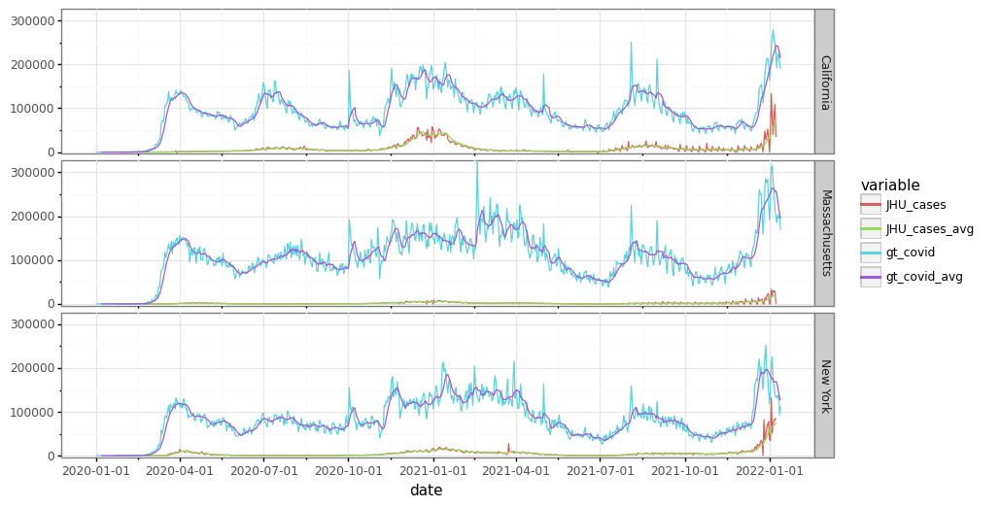

<ggplot: (8783526111365)>

In [69]:
df_filtered_raw = pd.melt(df_filtered,id_vars = ['state','date'])
p = (
        ggplot(df_filtered_raw[df_filtered_raw['variable'].str.fullmatch('JHU_cases|JHU_cases_avg|gt_covid|gt_covid_avg')])
        + aes(x="date", y="value", color = "variable")
        + geom_line()

        + labs(title="", y="")    
        + facet_grid('state ~ .')
        + theme(axis_text_x = element_text(angle = 45, hjust = 1))
        + scale_y_continuous(expand = (0,0))
        + theme_bw()
        + theme(figure_size=(10, 6))  # here you define the plot size
    )
# ggsave(plot = p, filename='7dayavg.png', dpi=1000)
p

In [70]:
# normalize variables for plotting
#df_filtered[['JHU_cases_avg','gt_covid',]] = df_filtered.groupby('state').transform(lambda x: (x/x.max()))
df_filtered.loc[:, ~df_filtered.columns.isin(['state', 'date'])] = df_filtered.groupby('state').transform(lambda x: (x/x.max()))

df_filtered = pd.melt(df_filtered,id_vars = ['state','date'])

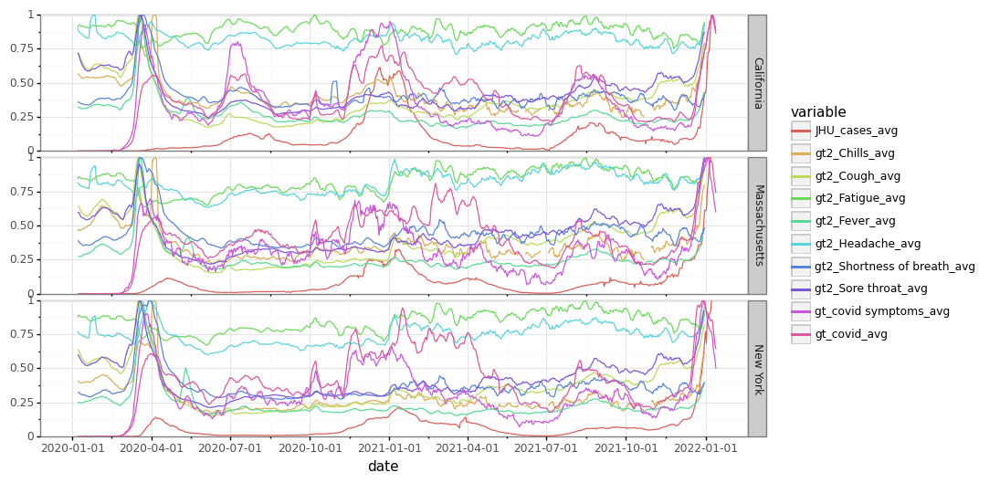

<ggplot: (8783517168093)>

In [71]:
p = (
    ggplot(df_filtered[df_filtered['variable'].str.contains('JHU_cases_avg|gt2_Cough_avg|gt2_Fever_avg|gt2_Headache_avg|gt2_Fatigue_avg|gt2_Chills_avg|gt2_Shortness of breath_avg|gt2_Sore throat_avg|gt_covid_avg|gt_covid symptoms_avg')])
    + aes(x="date", y="value", color = "variable")
    + geom_line()
    #+ scale_x_timedelta(name="Date") 
    #+ scale_x_date(labels='%m-%Y')
    + labs(title="", y="")    
    + facet_grid('state ~ .')
    + theme(axis_text_x = element_text(angle = 45, hjust = 1))
    #+ expand_limits(y = 0)
    + scale_y_continuous(expand = (0,0))
    + theme_bw()
    + theme(figure_size=(10, 6))  # here you define the plot size
)

# ggsave(plot = p, filename='trendplot.png', dpi=1000)
p

state
Alabama           AxesSubplot(0.125,0.125;0.775x0.755)
Alaska            AxesSubplot(0.125,0.125;0.775x0.755)
Arizona           AxesSubplot(0.125,0.125;0.775x0.755)
Arkansas          AxesSubplot(0.125,0.125;0.775x0.755)
California        AxesSubplot(0.125,0.125;0.775x0.755)
Colorado          AxesSubplot(0.125,0.125;0.775x0.755)
Connecticut       AxesSubplot(0.125,0.125;0.775x0.755)
Delaware          AxesSubplot(0.125,0.125;0.775x0.755)
Florida           AxesSubplot(0.125,0.125;0.775x0.755)
Georgia           AxesSubplot(0.125,0.125;0.775x0.755)
Hawaii            AxesSubplot(0.125,0.125;0.775x0.755)
Idaho             AxesSubplot(0.125,0.125;0.775x0.755)
Illinois          AxesSubplot(0.125,0.125;0.775x0.755)
Indiana           AxesSubplot(0.125,0.125;0.775x0.755)
Iowa              AxesSubplot(0.125,0.125;0.775x0.755)
Kansas            AxesSubplot(0.125,0.125;0.775x0.755)
Kentucky          AxesSubplot(0.125,0.125;0.775x0.755)
Louisiana         AxesSubplot(0.125,0.125;0.775x0.755)
Main

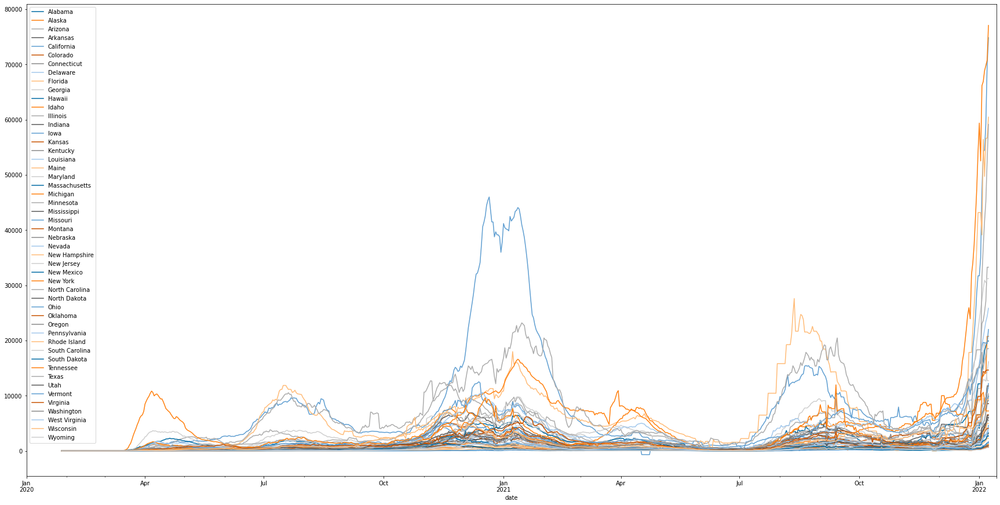

In [72]:
#define index column
df_full_eda.set_index('date', inplace=True)
df_full_eda.groupby('state')['JHU_cases_avg'].plot(legend=True,figsize=(30,15))

state
Alabama           AxesSubplot(0.125,0.125;0.775x0.755)
Alaska            AxesSubplot(0.125,0.125;0.775x0.755)
Arizona           AxesSubplot(0.125,0.125;0.775x0.755)
Arkansas          AxesSubplot(0.125,0.125;0.775x0.755)
California        AxesSubplot(0.125,0.125;0.775x0.755)
Colorado          AxesSubplot(0.125,0.125;0.775x0.755)
Connecticut       AxesSubplot(0.125,0.125;0.775x0.755)
Delaware          AxesSubplot(0.125,0.125;0.775x0.755)
Florida           AxesSubplot(0.125,0.125;0.775x0.755)
Georgia           AxesSubplot(0.125,0.125;0.775x0.755)
Hawaii            AxesSubplot(0.125,0.125;0.775x0.755)
Idaho             AxesSubplot(0.125,0.125;0.775x0.755)
Illinois          AxesSubplot(0.125,0.125;0.775x0.755)
Indiana           AxesSubplot(0.125,0.125;0.775x0.755)
Iowa              AxesSubplot(0.125,0.125;0.775x0.755)
Kansas            AxesSubplot(0.125,0.125;0.775x0.755)
Kentucky          AxesSubplot(0.125,0.125;0.775x0.755)
Louisiana         AxesSubplot(0.125,0.125;0.775x0.755)
Main

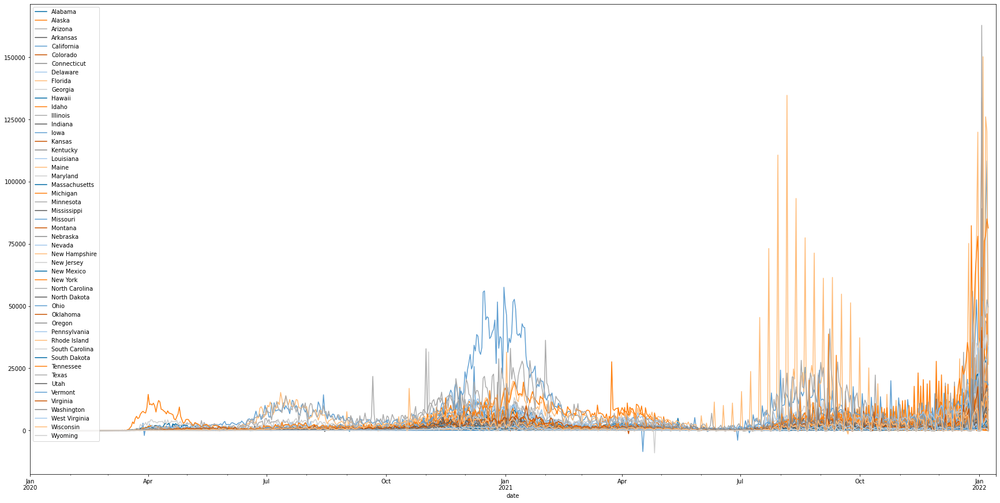

In [73]:
df_full_eda.groupby('state')['JHU_cases'].plot(legend=True,figsize=(30,15))

state
Alabama           AxesSubplot(0.125,0.125;0.775x0.755)
Alaska            AxesSubplot(0.125,0.125;0.775x0.755)
Arizona           AxesSubplot(0.125,0.125;0.775x0.755)
Arkansas          AxesSubplot(0.125,0.125;0.775x0.755)
California        AxesSubplot(0.125,0.125;0.775x0.755)
Colorado          AxesSubplot(0.125,0.125;0.775x0.755)
Connecticut       AxesSubplot(0.125,0.125;0.775x0.755)
Delaware          AxesSubplot(0.125,0.125;0.775x0.755)
Florida           AxesSubplot(0.125,0.125;0.775x0.755)
Georgia           AxesSubplot(0.125,0.125;0.775x0.755)
Hawaii            AxesSubplot(0.125,0.125;0.775x0.755)
Idaho             AxesSubplot(0.125,0.125;0.775x0.755)
Illinois          AxesSubplot(0.125,0.125;0.775x0.755)
Indiana           AxesSubplot(0.125,0.125;0.775x0.755)
Iowa              AxesSubplot(0.125,0.125;0.775x0.755)
Kansas            AxesSubplot(0.125,0.125;0.775x0.755)
Kentucky          AxesSubplot(0.125,0.125;0.775x0.755)
Louisiana         AxesSubplot(0.125,0.125;0.775x0.755)
Main

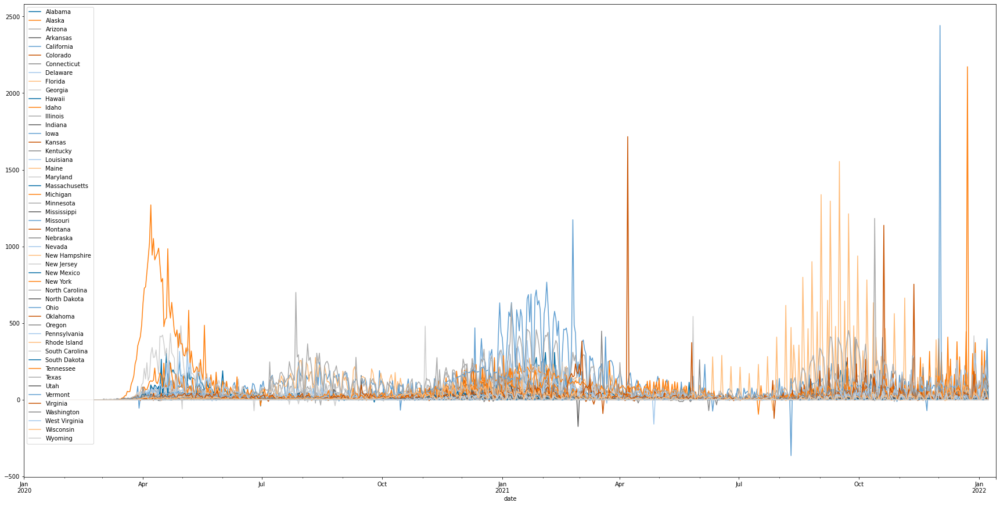

In [74]:
df_full_eda.groupby('state')['JHU_deaths'].plot(legend=True,figsize=(30,15))

### Check the values

In [75]:
df_full_eda.state.value_counts()

Rhode Island      745
Alaska            744
Florida           744
Oregon            744
Oklahoma          744
Vermont           744
South Carolina    744
Utah              744
South Dakota      744
Washington        744
West Virginia     744
Virginia          744
Georgia           744
Alabama           744
Hawaii            744
Maryland          744
Michigan          744
Minnesota         744
New Hampshire     744
North Carolina    744
Pennsylvania      744
Tennessee         744
Texas             744
Wisconsin         744
New Mexico        744
North Dakota      744
Ohio              744
New York          744
Arizona           744
Connecticut       744
Delaware          744
Arkansas          744
Colorado          744
California        744
Kansas            744
Iowa              744
Indiana           744
Idaho             744
Illinois          744
Louisiana         744
Massachusetts     744
Kentucky          744
Maine             744
Montana           744
Missouri          744
Nevada    

### Correlations

In [76]:
# Correlation of COVID-19 pandemic indicators
cq=pdp.cq.StartWith('gt2')|pdp.cq.StartWith('neighbor')
corr_transform = pdp.PdPipeline([
    pdp.ColDrop (columns=cq)
])
data = corr_transform.apply(df_full_eda)
corr = data.corr()

dat=df_full_eda[['JHU_cases','JHU_deaths','JHU_hospitalizations','up2date','gt_covid','gt_quarantine','gt_covid symptoms','gt2_Cough','gt2_Fever', 'gt2_Headache', 'gt2_Fatigue','gt2_Chills','gt2_Shortness of breath','gt2_Sore throat']]
corr = dat.corr()

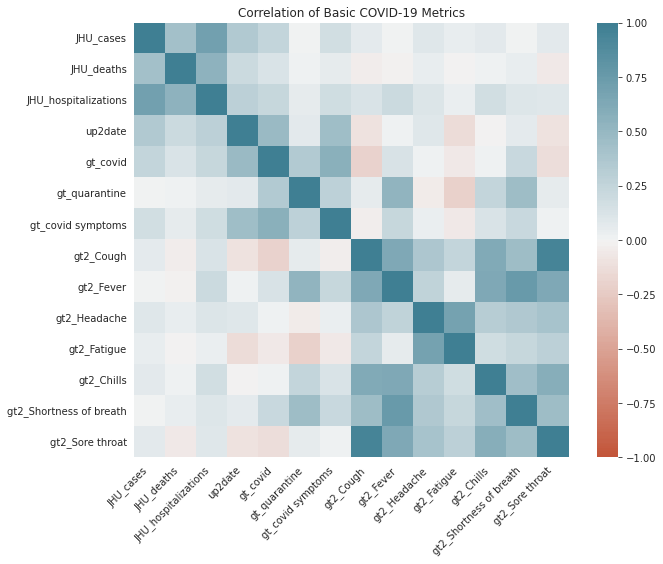

In [77]:
with sns.axes_style("white"):
  f, ax = plt.subplots(figsize=(10, 8))
  ax = sns.heatmap(
      corr, 
      vmin=-1, vmax=1, center=0,
      cmap=sns.diverging_palette(20, 220, n=200),
      square=True
  )
  ax.set_xticklabels(
      ax.get_xticklabels(),
      rotation=45,
      horizontalalignment='right'
  )
  ax.set_title('Correlation of Basic COVID-19 Metrics')
  ax

In [78]:
# check correlations with Cases
def heatmap_numeric_w_dependent_variable(df, dependent_variable):
    '''
    Takes df, a dependant variable as str
    Returns a heatmap of all independent variables' correlations with dependent variable 
    '''
    plt.figure(figsize=(8, 10))
    g = sns.heatmap(df.corr()[[dependent_variable]].sort_values(by=dependent_variable), 
                    annot=True, 
                    cmap='coolwarm', 
                    vmin=-1,
                    vmax=1) 
    return g

cq=pdp.cq.StartWith('gt2')|pdp.cq.StartWith('neighbor')

corr_transform = pdp.PdPipeline([
    pdp.ColDrop (columns=cq)
])

data = corr_transform.apply(df_full_eda)

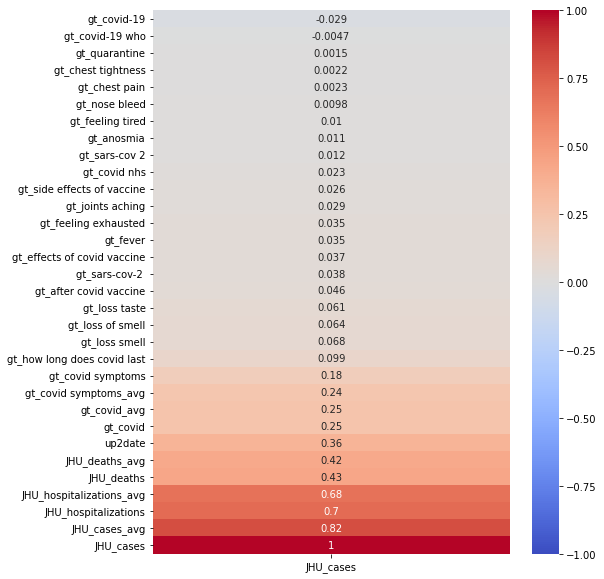

In [79]:
# correlation with cases
heatmap_numeric_w_dependent_variable(data, 'JHU_cases')

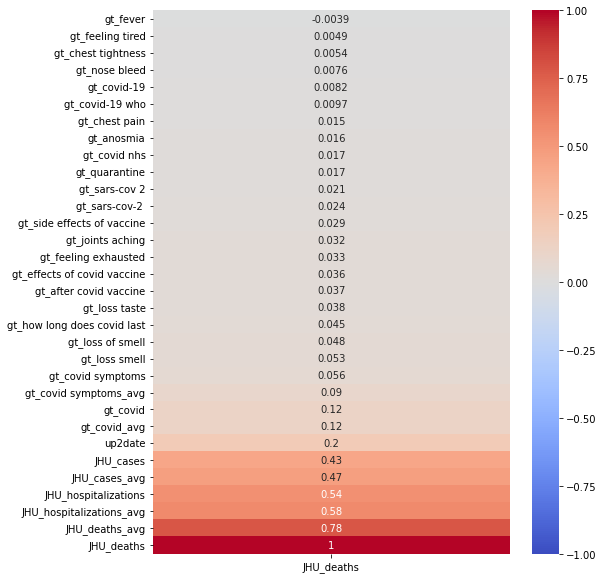

In [80]:
# correlation with deaths
heatmap_numeric_w_dependent_variable(data, 'JHU_deaths')

## Scale the data

[Return to section index](#1.1.-Scale_data)



Before splitting our data to train and test sets, we define a function to standardize our data in order to avoid the impact from different scales of features. We used the MinMaxScaler Transforms, which can both help us dealing with the different feature scales and avoid the outliers.

In [81]:
def standardize(dat):
    """
    Function to standardize data
    """
    scaler = MinMaxScaler()
    dat_std = scaler.fit_transform(dat.astype('float'))
    dat_std = pd.DataFrame(dat_std, columns=dat.columns, index=dat.index)
    return dat_std

In [82]:
# standardize only the eda interested features
df_full_std = standardize(df_dateindex[eda_predictor[2:]])
# add state column
df_full_std['state'] = np.array(df_dateindex.state)
df_full_std.head()

,gt_covid,gt_quarantine,gt_covid symptoms,gt2_Cough,gt2_Fever,gt2_Headache,gt2_Fatigue,gt2_Chills,gt2_Shortness of breath,gt2_Sore throat,state
2020-01-01,0.0,0.0,0.0,0.497677,0.208919,0.609697,0.713869,0.000000,0.000000,0.450088,Alaska
2020-01-02,0.0,0.0,0.0,0.537429,0.222261,0.646061,0.748905,0.000000,0.000000,0.574431,Alaska
2020-01-03,0.0,0.0,0.0,0.494579,0.198736,0.535758,0.770803,0.377778,0.000000,0.527145,Alaska
2020-01-04,0.0,0.0,0.0,0.491998,0.172402,0.521212,0.670073,0.000000,0.320946,0.486865,Alaska
2020-01-05,0.0,0.0,0.0,0.494579,0.172051,0.648485,0.757664,0.000000,0.375000,0.385289,Alaska


## Clustering States

[Return to section index](#1.2.-Clustering_States)
In order to have better performance in our model, we first tried to use unsupervised learning methods to cluster 50 states across US by their pandemic growth pattern. Thus, similar states will be implemented similar models.

We first applied PCA to reduce the dimensions of our 13 features, including cases, deaths, hopsitalization and 10 COVID-related google trends words. We selected the first pricincle compoents as the time series for 50 states and applied time series K-Means clustering. According to Elbow method and average silhouette scores, an optimal number of 2 clusters among 50 states was selected. The states in each cluster is listed below:

States in cluster 1: Alabama, Arizona, Arkansas, California, Colorado, Connecticut, Florida, Georgia, Illinois, Indiana, Iowa, Kansas, Kentucky, Louisiana, Maryland, Massachusetts, Michigan, Minnesota, Mississippi, Missouri, Nebraska, Nevada, New Hampshire, New Jersey, New York, North Carolina, Ohio, Oklahoma, Oregon, Pennsylvania, South Carolina, Tennessee, Texas, Virginia, Washington, Wisconsin.

States in cluster 2: Alaska, Delaware, Hawaii, Idaho, Maine, Montana, New Mexico, North Dakota, Rhode Island, South Dakota, Utah, Vermont, West Virginia, Wyoming.


In [83]:
cluster_features = ['state', 'date', 
                    'JHU_cases_avg','JHU_deaths_avg',
                    'JHU_hospitalizations_avg',
                    'gt_covid','gt_quarantine','gt_covid symptoms',
                    'gt2_Cough','gt2_Fever', 'gt2_Headache', 
                    'gt2_Fatigue','gt2_Chills','gt2_Shortness of breath',
                    'gt2_Sore throat']
cluster_state = df_full[cluster_features]


ppca = PPCA()
ppca.fit(data=df_full_std.iloc[: , :-1].to_numpy())
component_mat = ppca.transform()
component_mat = pd.DataFrame(component_mat[:,1])
component_mat['state'] = np.array(df_dateindex.state)
component_mat['date'] = np.array(df_full.date)
component_mat.columns = ['PC1', 'state','date']

ts_pc = component_mat.pivot(index = 'date', columns='state', values='PC1')

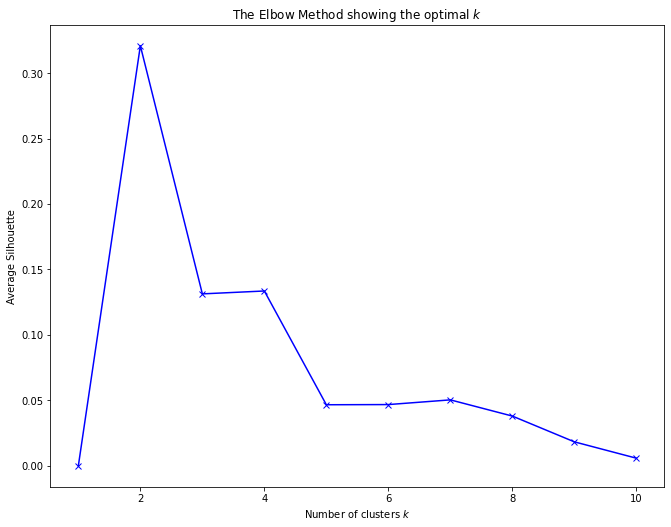

In [84]:

# Use Elbow method to decide the optimal k=2, suggesting there is two clusters in 50 states


scores = [0]
for i in range(2,11):
    km = TimeSeriesKMeans(n_clusters=i, metric="dtw",random_state = 109)
    labels = km.fit_predict(ts_pc.T)
    score = silhouette_score(ts_pc.T, labels, metric="dtw")
    scores.append(score)
    
plt.figure(figsize=(11,8.5))
plt.plot(range(1,11), np.array(scores), 'bx-')
plt.xlabel('Number of clusters $k$')
plt.ylabel('Average Silhouette')
plt.title('The Elbow Method showing the optimal $k$')
plt.show()

In [85]:
from tslearn.clustering import TimeSeriesKMeans

km = TimeSeriesKMeans(n_clusters=2, metric="dtw",random_state = 109)
labels = km.fit_predict(ts_pc.T)

ts_cluster = pd.DataFrame(ts_pc.columns)
ts_cluster['labels'] = labels

cluster_state = cluster_state.merge(ts_cluster, on='state', how='left')

state_cluster1 = list(ts_cluster['state'].loc[ts_cluster['labels']== 0].values)
state_cluster2 = list(ts_cluster['state'].loc[ts_cluster['labels']== 1].values)

In [86]:
print("States in cluster 1:" + str(state_cluster1)+ "\n containing "+ str(len(state_cluster1))+ " states." )
print("States in cluster 2:" + str(state_cluster2)+ "\n containing "+ str(len(state_cluster2))+ " states." )

df_cluster1 = df_full[df_full['state'].isin(state_cluster1)]
df_cluster2 = df_full[df_full['state'].isin(state_cluster2)]

States in cluster 1:['Alabama', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Florida', 'Georgia', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'South Carolina', 'Tennessee', 'Texas', 'Utah', 'Virginia', 'Washington', 'Wisconsin']
 containing 39 states.
States in cluster 2:['Alaska', 'Delaware', 'Hawaii', 'Idaho', 'Montana', 'North Dakota', 'Rhode Island', 'South Dakota', 'Vermont', 'West Virginia', 'Wyoming']
 containing 11 states.


## Generate Training and Testing Data

### Helper functions

In [87]:
def create_dataset(df, days_train, days_pred):
        X = np.array([])
        y = np.array([])
        yp = np.array([])
        state=[]
        date=[]
        gp = df.groupby('state')
        for ind in gp.groups.keys():
                df_new = gp.get_group(ind).sort_index()
        
                days_range = len(df_new)
                for i in range(days_range - (days_train + days_pred) + 1):
                        y_window = df_new['JHU_cases'].iloc[i + days_train: i + (days_train + days_pred)].to_numpy().reshape(1, days_pred)
                        yp_window = df_new['JHU_cases'].iloc[i: i + days_train].to_numpy().reshape(1, days_train)
                        # 
                        state_ind=df_new['state'][i: i + days_train]
                        date_ind=df_new.index[i: i + days_train]
                        
                        X_window = df_new.drop(columns=['state']).iloc[i: i + days_train, : ].to_numpy().reshape(1, days_train, -1)
                        
                
                        if X.shape[0] != 0:
                                X = np.append(X, X_window, axis = 0)
                                y = np.append(y, y_window, axis = 0)
                                yp = np.append(yp, yp_window, axis = 0)
                                state.append(state_ind[0])
                                date.append(date_ind)
                                
                        else:
                                X = X_window
                                y = y_window
                                yp = yp_window
                                state.append(state_ind[0])
                                date.append(date_ind)
                                
        
        return X, y, yp, state, date

### Train Test Split

In [88]:
def split_tr_te(df):
        # index to help split time series: 70%/30%
        date_ind = list(df.index.unique())
        n_days = len(date_ind) # number of unique days
        
        # split
        cutoff_ind = date_ind[int(n_days*0.7)]
        n_tr_dats = int(n_days*0.7)
        
        # multiply by states
        gp = len(df.state.unique( ))
        n_tr = n_tr_dats * gp
        df_tr = df.iloc[:n_tr, :]
        df_te = df.iloc[n_tr:, :]
        
        return df_tr, df_te, cutoff_ind

In [89]:
len(list(df_full_std.index.unique()))

745

In [90]:
df_full_std['JHU_cases'] = df_full.JHU_cases.values
columns=['state', 'JHU_cases', 'gt_covid','gt_quarantine','gt_covid symptoms',
                    'gt2_Cough','gt2_Fever', 'gt2_Headache', 
                    'gt2_Fatigue','gt2_Chills','gt2_Shortness of breath',
                    'gt2_Sore throat']
df1=df_full_std[columns]
df1=df1.sort_index()

In [91]:
df1_train, df1_test, df1_cutoff = split_tr_te(df1)
print(df1_train.shape,df1_test.shape)

(26050, 12) (11151, 12)


In [92]:
# get training data and testing data for models
days_train=14
days_pred=7
X_train, y_train, _,state_train,date_train = create_dataset(df1_train, days_train, days_pred)
X_test, y_test, _, state_test,date_test= create_dataset(df1_test, days_train, days_pred)

In [93]:
print("X_train and y_train shape:")
print(X_train.shape,y_train.shape)
print("X_test and y_test shape:")
print(X_test.shape,y_test.shape)

X_train and y_train shape:
(25050, 14, 11) (25050, 7)
X_test and y_test shape:
(10151, 14, 11) (10151, 7)


Now, we get our basic train and test split: all 50 states full data set with 2021-06-05 as the cutoff, before which serve as train set and after which the test set. Meanwhile, in both train and test sets, we use 14 past days' data to predict the following 7 days' cases. (We consider only JHU cases as response variable first.)

# 2. Research question

[Return to top](#Notebook-contents)

1. The best model in predicting pandemic growth in cases/deaths.
2. Suitable window size for training and prediction.

# 3. Modelling

[Return to top](#Notebook-contents)

To better understand the presiction sctructure as well as our outcome and predictors, we first consider baseline time-series models, including persistence model and multivariable linear regression models. These simple model doesn't perform well when some outbreak of pandemic happened and lead to huge root mean square rrror in models. There are too many factors that could affect COVID-19 cases and deaths, and structure of those time series is too flexible to be captured well in linear models. 

In order to predict next 7 days prediction based on the last 14 days of times series and relavent Google Trends data, it is necessary to account for dynamics that maybe not be linear in space and time. For example, the current number of cases may preclude future increments, and the past number of infected can explain the number of cases in other regions.

Therefore, we have explored models with neural networks to capture the complex trend in COVID-19 cases and deaths. Besides, we also try to analyze counts in both directions using a bidirectional network later specified. Looking at COVID-19 in this way is what we try to do in reading a text: a new word sometimes can be understood reading forward rather than just looking backwards. 

We explored the structure of Conv-NN, RNN, Bi-RNN, GRU, Bi-GRU, LSTM, and Bi-LSTM to predict the time series. In Conv-NN, the convolutional layer serves as a pre-processing step. RNN, Bi-RNN, GRU, Bi-GRU, LSTM, and Bi-LSTM were commonly-used model for time series prediction becaused their structure are well suited for sequential data.

The Conv-NN includes two Conv1D layers with filter size of 64 and 128 with ReLu activation, followed by a flatten layer and three dense layers with 256, 128, 64 of neurons in each layer. We also incldued two dropout layers to prevent overfiting. In RNN, Bi-RNN, GRU, Bi-GRU, LSTM, and Bi-LSTM, the numbers of neurons in the hidden layers of RNN, GRU, and LSTM were 200. ReLu was used in all dense intermediate layers to introduce non-linearity in the activation functions. The output layer is a Dense layer with 7 of neurons with linear activation for prediction of time series. All models were trained in Adam optimiser with a liearning rate of 0.001. All models were trained for 50 epochs with a early stopping patience of 3 to prevent overfiting. The loss of the models is set as mean squred error (MSE). 

We have included the following four model evaluation metrics:
1. Pearson Correlation
2. Root Mean Square Error (RMSE), or L2 loss function. For regression tasks, it is a popular choice of loss function. But it is sensitive to outliers.
3. Mean Absolute Error (MAE), or L1 loss function. When a dataset has a large number of outliers, it is an alternative to the MSE.
4. Symmetric Mean Absolute Percentage Error (sMAPE)



## Baseline Time-series Models

[Return to section index](#3.1.-Baseline_Models)



### Persistence Model

A baseline in forecast performance provides a point of comparison. The most common baseline method for supervised machine learning is the  persistence algorithm, which uses the value at the previous time step (t-1) to predict the expected outcome at the next time step (t+1)(A persistence model assumes that the future value of a time series is calculated under the assumption that nothing changes between the current time and the forecast time).

To make this concrete, we will use it to establish a baseline performance in our setting.

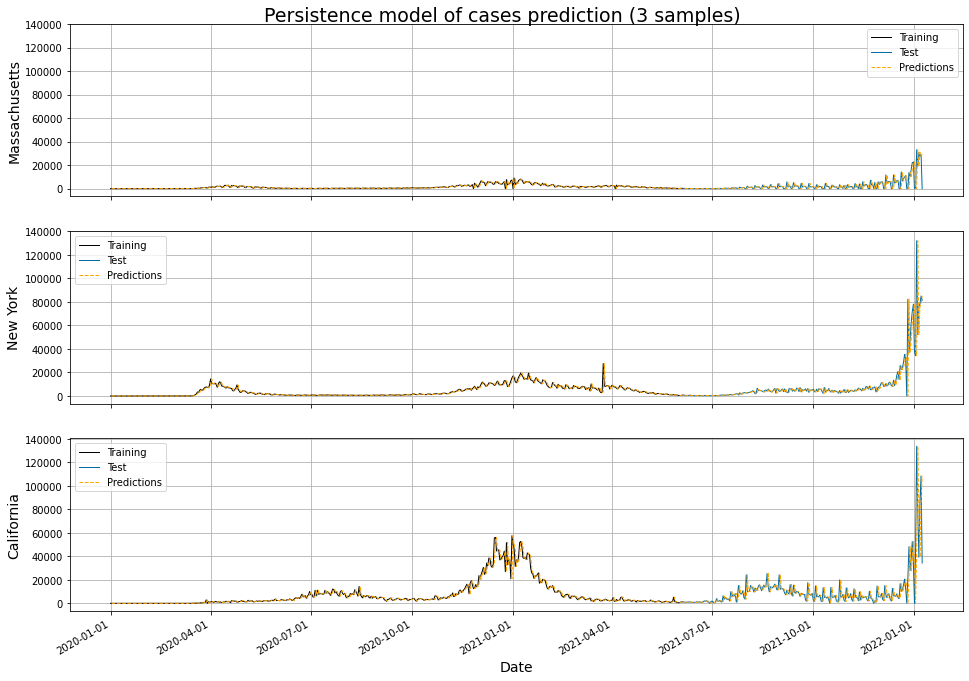

In [94]:
sample_states = ["Massachusetts", "New York", "California"]
def p(x):
    p_dat = pd.concat([x.shift(1), x], axis=1)
    p_dat.columns = ['x', 'y']
    return p_dat
fig, ax = plt.subplots(len(sample_states), sharex=True, sharey=True, figsize=(16,4*len(sample_states)))
fig.suptitle('Persistence model of cases prediction (3 samples)', fontsize = 19, y=.9)
for i in range(len(sample_states)):

    df_pers_model_train = df1_train[df1_train['state'].str.contains(sample_states[i])]
    df_pers_model_test = df1_test[df1_test['state'].str.contains(sample_states[i])]
    train = p(df_pers_model_train['JHU_cases'])
    test = p(df_pers_model_test['JHU_cases'])

    train_X, train_y = train.iloc[:,0], train.iloc[:,1]
    test_X, test_y = test.iloc[:,0], test.iloc[:,1]

    ax[i].plot(df_pers_model_train.index, train_y, 'k', linewidth = 1,  label="Training")
    ax[i].plot(df_pers_model_train.index, train_X, 'orange', linewidth = 1,  linestyle="--")
    ax[i].plot(df_pers_model_test.index[:-5], test_y[:-5], linewidth = 1,  label="Test")
    ax[i].plot(df_pers_model_test.index[:-5], test_X[:-5], 'orange', linewidth = 1,  linestyle="--",  label="Predictions")
    ax[i].grid(True)
    ax[i].legend()
    ax[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax[i].set_ylabel(sample_states[i], fontsize = 14)
    ax[i].set_xlabel('Date', fontsize = 14)
fig.autofmt_xdate()
fig.show()

### OLS Model

From section 1.3, we have 2 cluster of states (39 in cluster1 and 11 in cluster2). We fit 2 multivariable linear regression separately for these 2 cluster states: using 10 google trends predictors and JHU cases as responses.

In [95]:
df1_train1 = df1_train[df1_train['state'].isin(state_cluster1)]
df1_train2 = df1_train[df1_train['state'].isin(state_cluster2)]
df1_test1 = df1_test[df1_test['state'].isin(state_cluster1)]
df1_test2 = df1_test[df1_test['state'].isin(state_cluster2)]
# OLS
X1 = df1_train1[eda_predictor[2:]]
X1 = sm.add_constant(X1) 
X2 = df1_train2[eda_predictor[2:]]
X2 = sm.add_constant(X2) 
X_te1 = df1_test1[eda_predictor[2:]]
X_te1 = sm.add_constant(X_te1) 
X_te2 = df1_test2[eda_predictor[2:]]
X_te2 = sm.add_constant(X_te2) 

y1 = df1_train1['JHU_cases']
y2 = df1_train2['JHU_cases']
y_te1 = df1_test1['JHU_cases']
y_te2 = df1_test2['JHU_cases']


model_lm1 = sm.OLS(y1, X1).fit()
model_lm2 = sm.OLS(y2, X2).fit()
# Print summary
print(model_lm1.summary())
print(model_lm2.summary())

pred_tr1 = model_lm1.get_prediction(X1).summary_frame()
pred_tr2 = model_lm2.get_prediction(X2).summary_frame()
pred_te1 = model_lm1.get_prediction(X_te1).summary_frame()
pred_te2 = model_lm2.get_prediction(X_te2).summary_frame()
pred_tr1['state'] = df1_train1.state
pred_tr2['state'] = df1_train2.state
pred_te1['state'] = df1_test1.state
pred_te2['state'] = df1_test2.state

                            OLS Regression Results                            
Dep. Variable:              JHU_cases   R-squared:                       0.182
Model:                            OLS   Adj. R-squared:                  0.182
Method:                 Least Squares   F-statistic:                     452.4
Date:                Sat, 07 May 2022   Prob (F-statistic):               0.00
Time:                        20:30:24   Log-Likelihood:            -1.9026e+05
No. Observations:               20319   AIC:                         3.805e+05
Df Residuals:                   20308   BIC:                         3.806e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                   -2

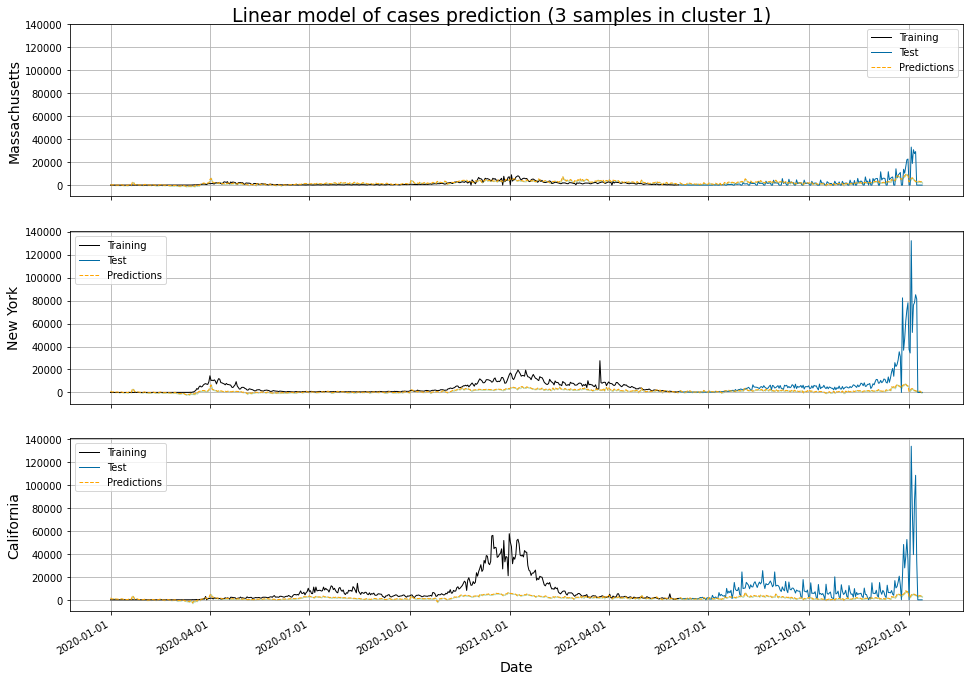

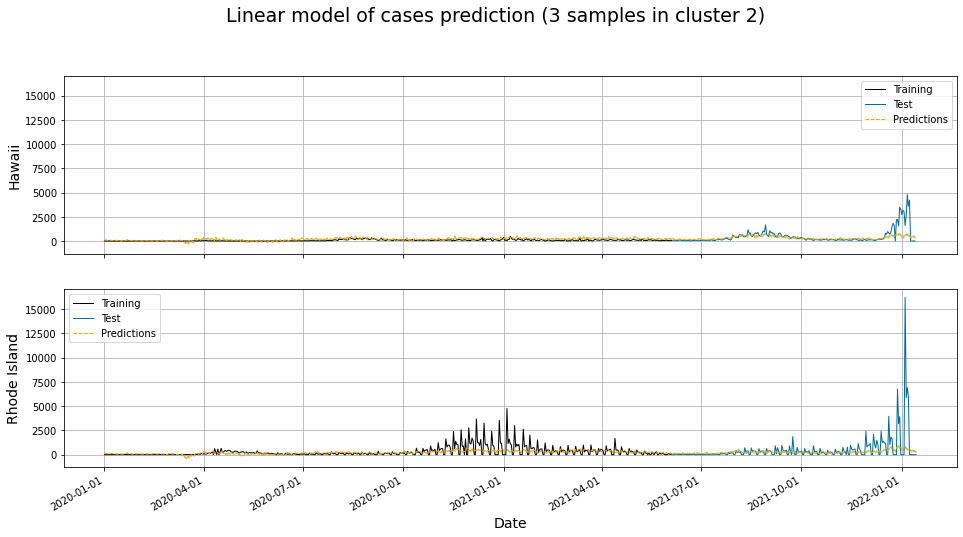

In [96]:
sample_states = ["Massachusetts", "New York", "California"]
fig, ax = plt.subplots(len(sample_states), sharex=True, sharey=True, figsize=(16,4*len(sample_states)))
fig.suptitle('Linear model of cases prediction (3 samples in cluster 1)', fontsize = 19, y=.9)
for i in range(len(sample_states)):
    tr1 = pred_tr1[pred_tr1['state'].str.contains(sample_states[i])]
    te1 = pred_te1[pred_te1['state'].str.contains(sample_states[i])]
    ax[i].plot(tr1.index, y1[pred_tr1['state'].str.contains(sample_states[i])], 'k', linewidth = 1,  label="Training")
    ax[i].plot(te1.index, y_te1[pred_te1['state'].str.contains(sample_states[i])], linewidth = 1,  label="Test")
    ax[i].plot(tr1.index, tr1['mean'], 'orange', linewidth = 1,  linestyle="--")
    ax[i].plot(te1.index, te1['mean'], 'orange', linewidth = 1,  linestyle="--",  label="Predictions")
    ax[i].fill_between(tr1.index, tr1['mean_ci_lower'], 
                tr1['mean_ci_upper'], color='g', alpha=.2)
    ax[i].fill_between(te1.index, te1['mean_ci_lower'], 
                te1['mean_ci_upper'], color='g', alpha=.2)
    ax[i].grid(True)
    ax[i].legend()
    ax[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax[i].set_ylabel(sample_states[i], fontsize = 14)
    ax[i].set_xlabel('Date', fontsize = 14)
fig.autofmt_xdate()
fig.show()

sample_states2 = ["Hawaii", "Rhode Island"]
fig, ax = plt.subplots(len(sample_states2), sharex=True, sharey=True, figsize=(16,4*len(sample_states2)))
fig.suptitle('Linear model of cases prediction (3 samples in cluster 2)', fontsize = 19, y=1)
for i in range(len(sample_states2)):
    tr2 = pred_tr2[pred_tr2['state'].str.contains(sample_states2[i])]
    te2 = pred_te2[pred_te2['state'].str.contains(sample_states2[i])]
    ax[i].plot(tr2.index, y2[pred_tr2['state'].str.contains(sample_states2[i])], 'k', linewidth = 1,  label="Training")
    ax[i].plot(te2.index, y_te2[pred_te2['state'].str.contains(sample_states2[i])], linewidth = 1,  label="Test")
    ax[i].plot(tr2.index, tr2['mean'], 'orange', linewidth = 1,  linestyle="--")
    ax[i].plot(te2.index, te2['mean'], 'orange', linewidth = 1,  linestyle="--",  label="Predictions")
    ax[i].fill_between(tr2.index, tr2['mean_ci_lower'], 
                tr2['mean_ci_upper'], color='g', alpha=.2)
    ax[i].fill_between(te2.index, te2['mean_ci_lower'], 
                te2['mean_ci_upper'], color='g', alpha=.2)
    ax[i].grid(True)
    ax[i].legend()
    ax[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax[i].set_ylabel(sample_states2[i], fontsize = 14)
    ax[i].set_xlabel('Date', fontsize = 14)
fig.autofmt_xdate()
fig.show()

In [97]:
# calculate RMSE
lm1_rmse = mean_squared_error(y_te1[1:].values,pred_te1['mean'][1:].values)
lm2_rmse = mean_squared_error(y_te2[1:].values,pred_te2['mean'][1:].values)

## Helper functions



In [98]:
### ### ### ### ### ###
 # Helper functions #
### ### ### ### ### ### 

# Plot model history - MSE
def plot_history(history):
        plt.figure(figsize = (10,5))
        plt.plot(history.history['loss'], label = 'Training Data')
        plt.plot(history.history['val_loss'], label = 'Validation Data')
        plt.title('history')
        plt.ylabel('MSE')
        plt.xlabel('Epoch')
        plt.legend()
        plt.show()

# Plot model history - MAE
def plot_history_mae(history):
        plt.figure(figsize = (10,5))
        plt.plot(history.history['loss'], label = 'Training Data')
        plt.plot(history.history['val_loss'], label = 'Validation Data')
        plt.title('history')
        plt.ylabel('MAE')
        plt.xlabel('Epoch')
        plt.legend()
        plt.show()

# Print correlation score
def print_corr(y_true,y_pred):
    print('Pearson correlation: {:.4f}'.format(scipy.stats.pearsonr(np.ndarray.flatten(y_true),np.ndarray.flatten(y_pred))[0]))

# print RMSE
def print_rmse(y_true,y_pred):
    pred = list([float(y_pred[k][0]) for k in range(y_pred.shape[0])])
    obs= list([float(y_true[k][0]) for k in range(y_true.shape[0])])
    sub = [(pred[i]-obs[i])**2 for i in range(len(pred))]
    rmse = np.sqrt(sum(sub)/len(sub))
    print('Root Mean Square Error (RMSE): {:.4f}'.format(rmse))

# print MAE
def print_mae(y_true,y_pred):
    print('Mean Absolute Error (MAE): {:.4f}'.format(mean_absolute_error(np.ndarray.flatten(y_true),np.ndarray.flatten(y_pred))))

# print sMAPE( as there are 0 values, we cannot use MAPE)
def print_smape(y_true,y_pred):
    y_true, y_pred = np.ndarray.flatten(y_true), np.ndarray.flatten(y_pred)
    smape= 1/len(y_true) * np.sum(2 * np.abs(y_pred-y_true) / (np.abs(y_true) + np.abs(y_pred))*100)
    print('Symmetric Mean Absolute Percentage Error (SMAPE): {:.4f}'.format(smape))
    
# plot n days averaged prediction
def plot_avg(y_true,y_pred,ax=None, name="cases"):
        if ax is not None:
                loc=ax
        else:
                loc=plt
                plt.figure(figsize=(16,4))
                
                loc.plot(np.mean(y_true,axis=1), label="Observed")
                loc.plot(np.mean(y_pred,axis=1), ls='--', label="Predicted")
                
                if ax is None:
                        plt.legend(fontsize=15, loc=2)
                plt.title(f"Plotting averaged {name} over time", size=20)
                plt.xlabel("Days", size=15)

# plot actual prediction
def plot_ndays(y_true,y_pred,ax=None, name="cases"):
    obs = []
    for i in range(len(y_true)):
            obs.append(y_true[i, 0])

    if ax is not None:
            loc=ax
    else:
            loc=plt
    plt.figure(figsize=(16,4))

    loc.plot(np.arange(0, len(obs)), obs)
    for i in range(len(y_pred)):
            loc.plot(np.arange(i, i+y_pred.shape[-1]), y_pred[i],c = 'orange')

    if ax is None:
            plt.legend(['Observed', 'Predicted'], fontsize=15, loc=2)
    plt.title(f"Plotting {name} over time", size=20)
    plt.xlabel("Days", size=15)
    plt.grid(True)

  
# plot for 5 states
def plot_5states(mod, mod_name, ax=None, name="Cases"):
    sample_states = ["Massachusetts", "New York", "California","Hawaii", "Rhode Island"]

    fig, ax = plt.subplots(len(mod_name), 5, figsize=(20,len(mod_name)*5))
    fig.suptitle(f"{name} Prediction", fontsize="30")

    pos = 0
    for i in range(len(mod_name)):
        for j in range(5):

            indices = [index for index, element in enumerate(state_test) if element == sample_states[j]]
            y_pred=mod[i].predict(X_test[indices])
            y_true=y_test[indices]

            obs = []
            for ind in range(len(y_true)):
                    obs.append(y_true[ind, 0])
            ax[i,j].grid(True)          
            ax[i,j].plot(np.arange(0, len(obs)), obs)
            for ind in range(len(y_pred)):
                ax[i,j].plot(np.arange(ind, ind+y_pred.shape[-1]), y_pred[ind],c = 'orange')
            ax[i,j].legend(['Observed', 'Predicted'], fontsize=15, loc=2)
            pos+=1

    for ax_, row in zip(ax[:,0], mod_name):
        ax_.set_ylabel(row, rotation=0, size='xx-large')
    for ax_, col in zip(ax[0], sample_states):
        ax_.set_title(col, size=15)
    
    for i in range(len(mod_name)):
        y_pred=mod[i].predict(X_test)
        print(str(mod_name[i])+": ")
        print_corr(y_test,y_pred)
        print_rmse(y_test,y_pred)
        print_mae(y_test,y_pred)
        print_smape(y_test,y_pred)
        print("\n")

## Conv-NN

This section we built an convolutional neural network (CNN) with Dense layers for time series predictions. 

In [99]:
# NN: 
def build_nn(model_name):
        model = Sequential(name=model_name)
        model.add(Input(shape = X_train.shape[1:]))
        model.add(Conv1D(filters = 64, kernel_size = 3, padding = 'valid', activation = 'relu'))
        model.add(Conv1D(filters = 128, kernel_size = 3, padding = 'valid', activation = 'relu'))        
        model.add(Flatten())          
        model.add(Dense(256, activation = 'relu'))
        model.add(Dropout(0.5))
        model.add(Dense(128, activation = 'relu'))
        model.add(Dropout(0.5))        
        model.add(Dense(64, activation = 'relu'))
        model.add(Dense(days_pred, activation='linear'))
        return model

early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_root_mean_squared_error', min_delta=0, patience=3, verbose=0, mode='auto'
)
callbacks = [early_stopping]

nn_1 = build_nn('nn1')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
nn_1.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
nn_1.summary()


history_nn_1 = nn_1.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks)

Model: "nn1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 12, 64)            2176      
                                                                 
 conv1d_1 (Conv1D)           (None, 10, 128)           24704     
                                                                 
 flatten (Flatten)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 256)               327936    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0       

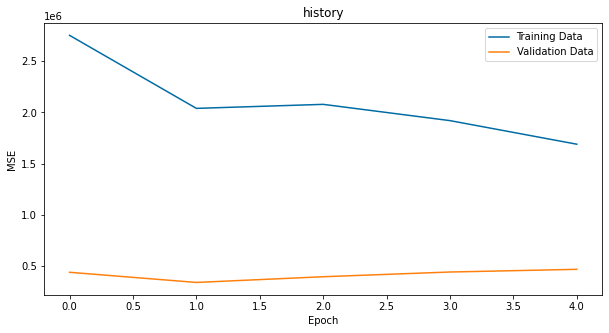

In [100]:
# Plot training history
plot_history(history_nn_1)

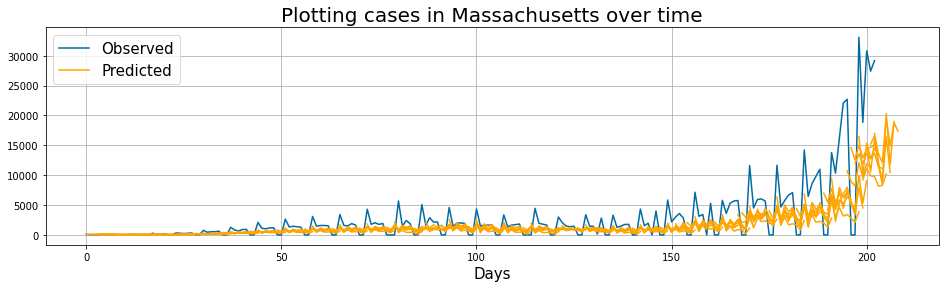

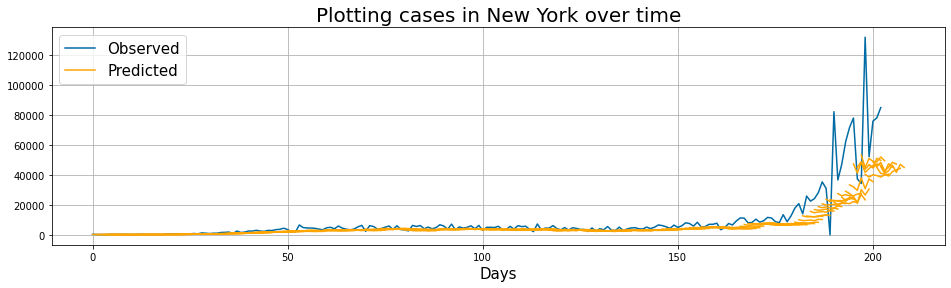

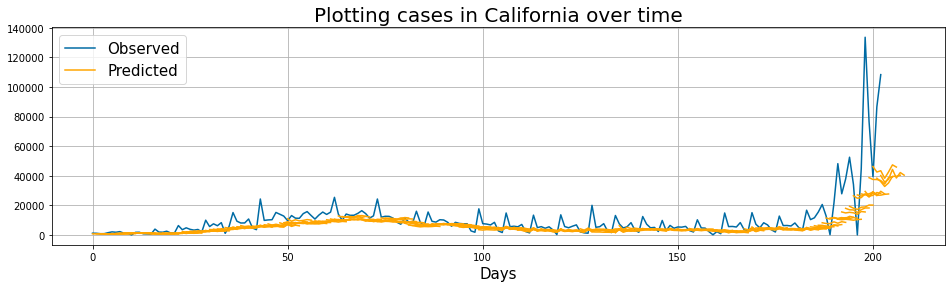

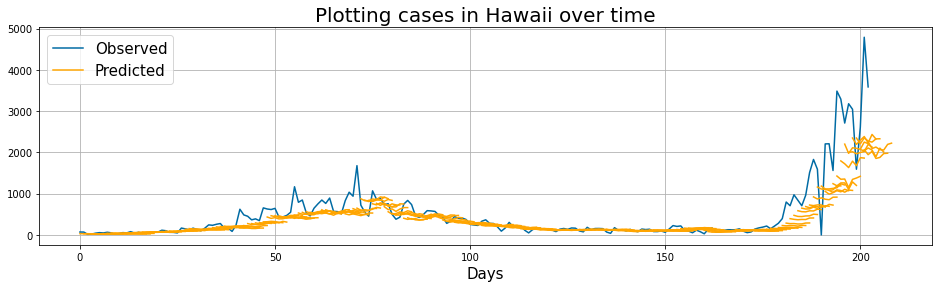

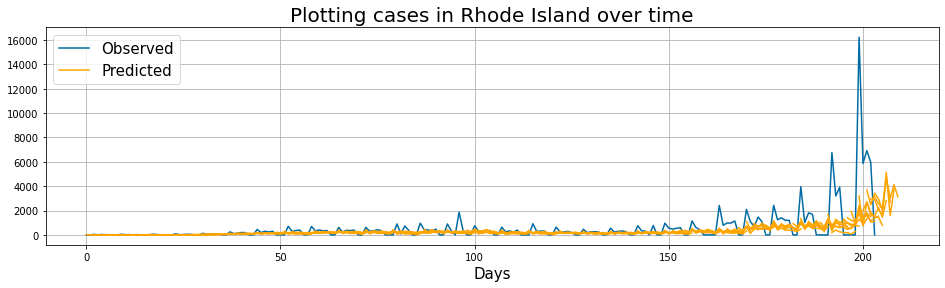

In [101]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=nn_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=nn_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

In [102]:
y_pred = nn_1.predict(X_test)
print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

Pearson correlation: 0.6641
Root Mean Square Error (RMSE): 4998.9929
Mean Absolute Error (MAE): 1746.8153
Symmetric Mean Absolute Percentage Error (SMAPE): 96.7432


## RNN

This section we built two recurrent neural network (RNNs) for time series predictions. RNN1 is simple RNN, followed by a dense layer to transform model output into a sequence of length 7 to match the shape of the outcome. RNN2B use two bidirectional RNN layers.

### RNN with 1 layer

In [103]:
# RNN: 1L
def build_rnn_1(model_name):
        model = Sequential(name=model_name)
        model.add(Input(shape = X_train.shape[1:])) 
        model.add(SimpleRNN(units=200, activation='relu', return_sequences = False))
        model.add(Dense(days_pred, activation='linear'))
        return model

early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_root_mean_squared_error', min_delta=0, patience=3, verbose=0, mode='auto'
)
callbacks = [early_stopping]

rnn_1 = build_rnn_1('rnn_baseline')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
rnn_1.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
rnn_1.summary()


history_rnn1 = rnn_1.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks
        )

Model: "rnn_baseline"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 200)               42400     
                                                                 
 dense_4 (Dense)             (None, 7)                 1407      
                                                                 
Total params: 43,807
Trainable params: 43,807
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
353/353 [==============================] - 9s 23ms/step - loss: 1782504.0000 - root_mean_squared_error: 1335.1050 - val_loss: 346159.3750 - val_root_mean_squared_error: 588.3531
Epoch 2/50
353/353 [==============================] - 8s 21ms/step - loss: 1278143.1250 - root_mean_squared_error: 1130.5498 - val_loss: 371928.5000 - val_root_mean_squared_error: 609.8594
Epoch 3/50
353/353 [==============================] - 8s 22ms/step -

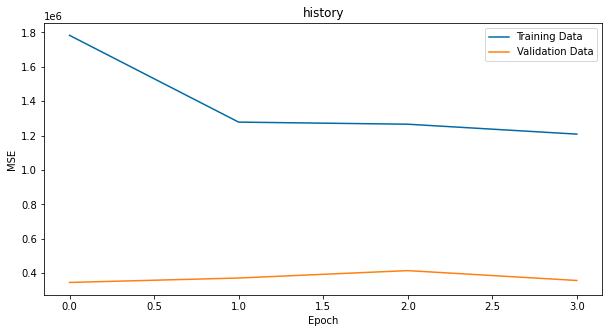

In [104]:
# Plot training history
plot_history(history_rnn1)

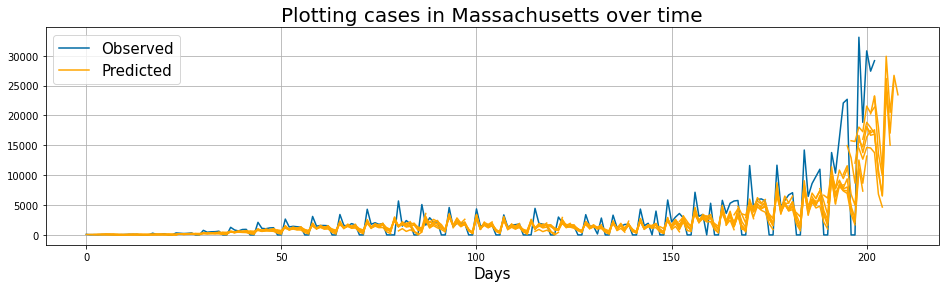

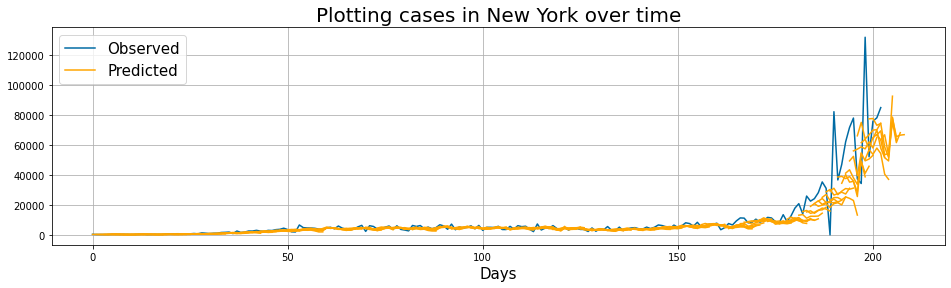

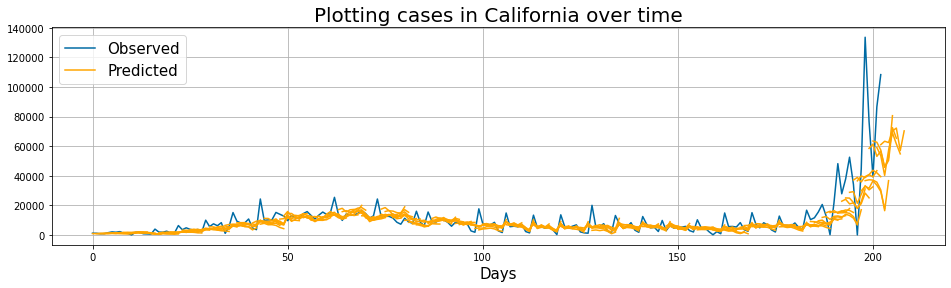

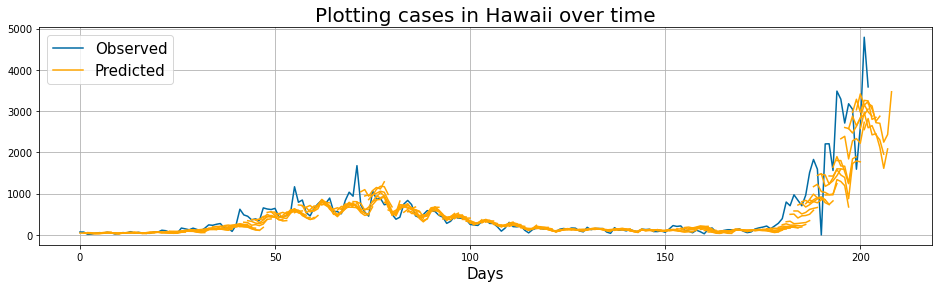

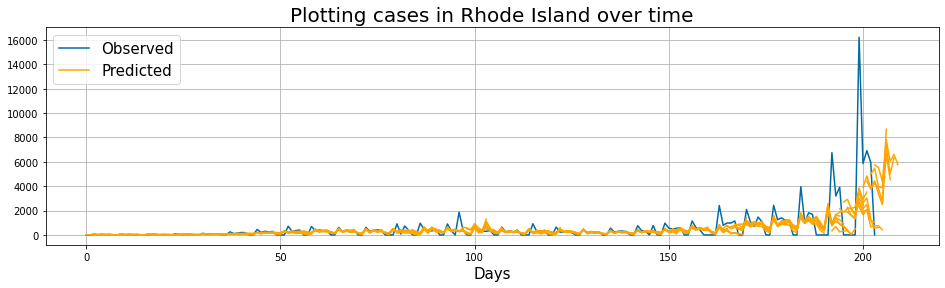

In [105]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=rnn_1.predict(X_test[indices])
    y_true=y_test[indices]

    #plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=rnn_1.predict(X_test[indices])
    y_true=y_test[indices]

#   plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

In [106]:
y_pred = rnn_1.predict(X_test)
print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

Pearson correlation: 0.6756
Root Mean Square Error (RMSE): 4848.1871
Mean Absolute Error (MAE): 1461.0913
Symmetric Mean Absolute Percentage Error (SMAPE): 80.7814


### Bi-RNN with 2 bidirectional layers

In [107]:
# RNN: 
def build_rnn_2b(model_name):
        model = Sequential(name=model_name)
        model.add(Input(shape = X_train.shape[1:]))
        model.add(Bidirectional(SimpleRNN(units=200, activation='relu', return_sequences = True)))
        model.add(Bidirectional(SimpleRNN(units=200, activation='relu', return_sequences = False)))
        model.add(Dense(days_pred, activation='linear'))
        return model

early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_root_mean_squared_error', min_delta=0, patience=3, verbose=0, mode='auto'
)
callbacks = [early_stopping]

rnn_2b = build_rnn_2b('rnn_2b')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
rnn_2b.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
rnn_2b.summary()


history_rnn2b = rnn_2b.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks
        )

Model: "rnn_2b"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirectiona  (None, 14, 400)          84800     
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 400)              240400    
 nal)                                                            
                                                                 
 dense_5 (Dense)             (None, 7)                 2807      
                                                                 
Total params: 328,007
Trainable params: 328,007
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
353/353 [==============================] - 35s 90ms/step - loss: 1631282.2500 - root_mean_squared_error: 1277.2166 - val_loss: 351719.8125 - val_root_mean_squared_error: 593.0

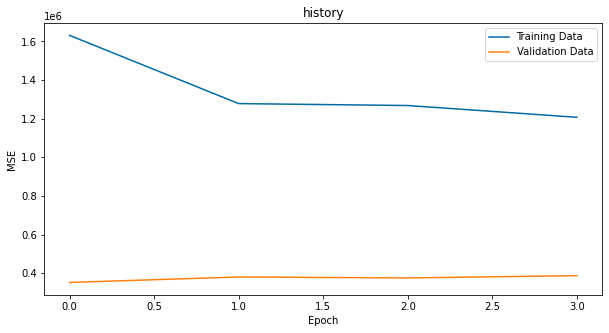

In [108]:
# Plot training history
plot_history(history_rnn2b)

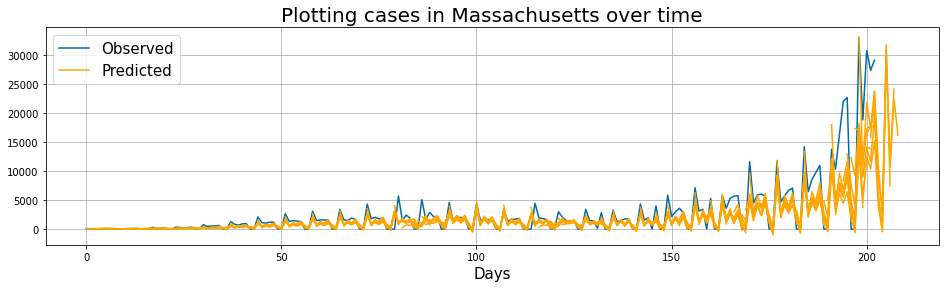

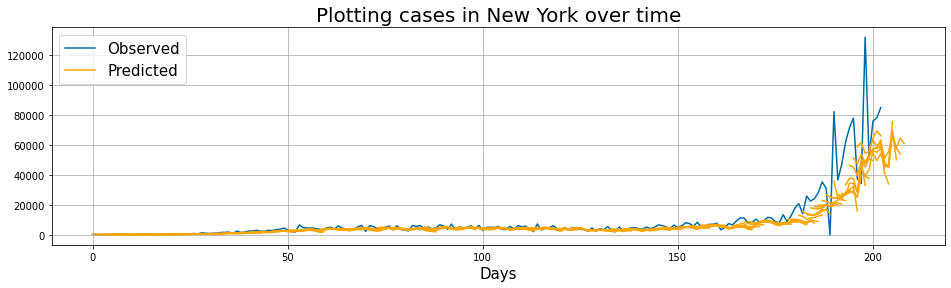

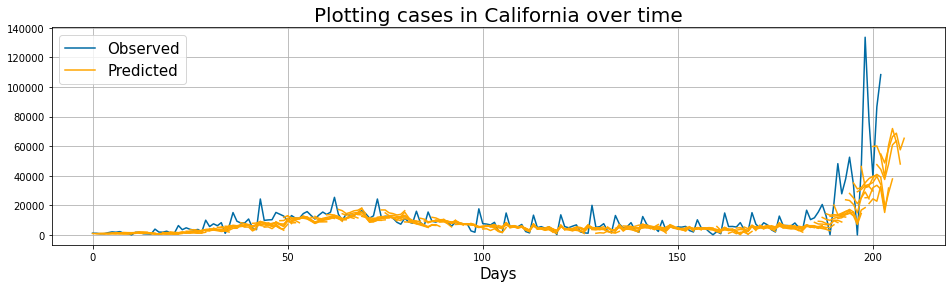

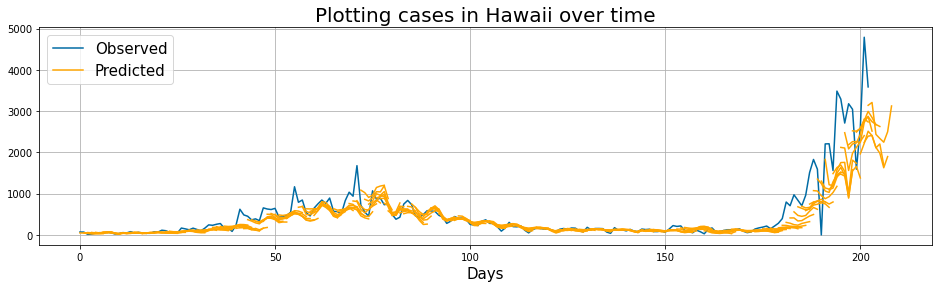

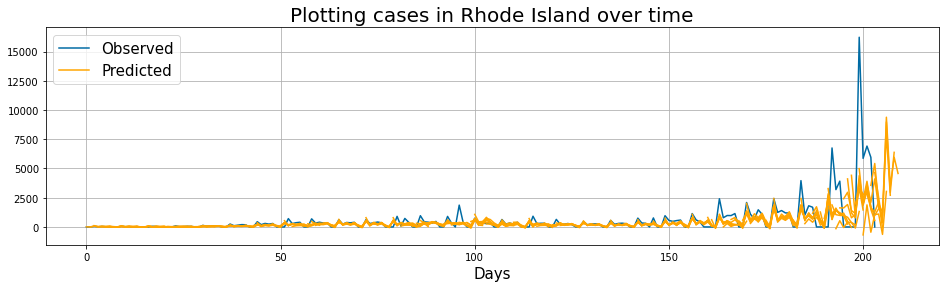

In [109]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=rnn_2b.predict(X_test[indices])
    y_true=y_test[indices]

#    plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=rnn_2b.predict(X_test[indices])
    y_true=y_test[indices]

#    plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

In [110]:
y_pred = rnn_2b.predict(X_test)
print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

Pearson correlation: 0.6883
Root Mean Square Error (RMSE): 5013.6910
Mean Absolute Error (MAE): 1453.8002
Symmetric Mean Absolute Percentage Error (SMAPE): 86.1171


## GRU

This section we built two Gated recurrent units (GRUs) for time series predictions. GRU1 is one layer GRU, followed by a dense layer. GRU2B use two bidirectional RNN layers.

### GRU with 1 layer

In [111]:
# GRU: 1L
def build_gru_1(model_name):
        model = Sequential(name=model_name)
        model.add(Input(shape = X_train.shape[1:])) 
        model.add(GRU(units=200, activation='relu', return_sequences = False))
        model.add(Dense(days_pred, activation='linear'))
        return model

early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_root_mean_squared_error', min_delta=0, patience=3, verbose=0, mode='auto'
)
callbacks = [early_stopping]

gru_1 = build_gru_1('gru1')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
gru_1.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
gru_1.summary()


history_gru_1 = gru_1.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks)

Model: "gru1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 200)               127800    
                                                                 
 dense_6 (Dense)             (None, 7)                 1407      
                                                                 
Total params: 129,207
Trainable params: 129,207
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
353/353 [==============================] - 26s 68ms/step - loss: 2256419.0000 - root_mean_squared_error: 1502.1379 - val_loss: 347794.7188 - val_root_mean_squared_error: 589.7413
Epoch 2/50
353/353 [==============================] - 24s 67ms/step - loss: 1376670.5000 - root_mean_squared_error: 1173.3158 - val_loss: 343803.7812 - val_root_mean_squared_error: 586.3478
Epoch 3/50
353/353 [==============================] - 24s 67ms/step - lo

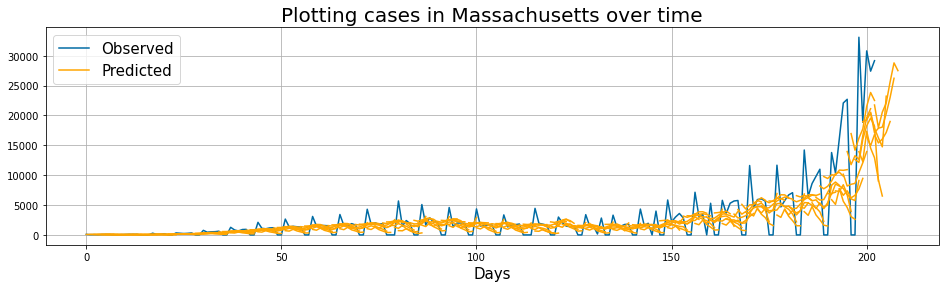

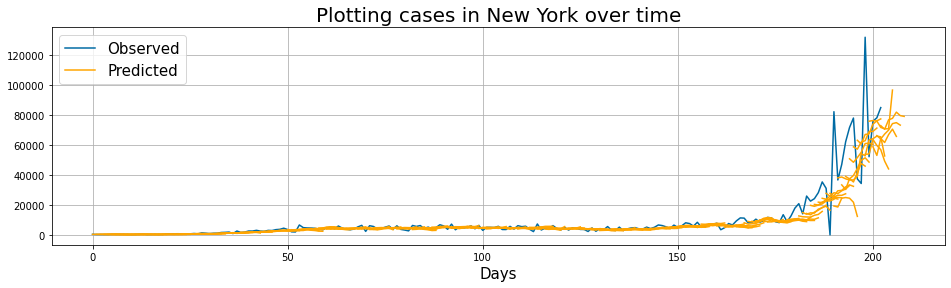

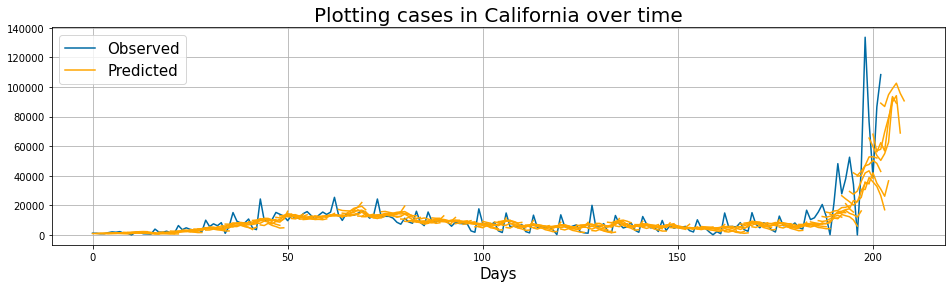

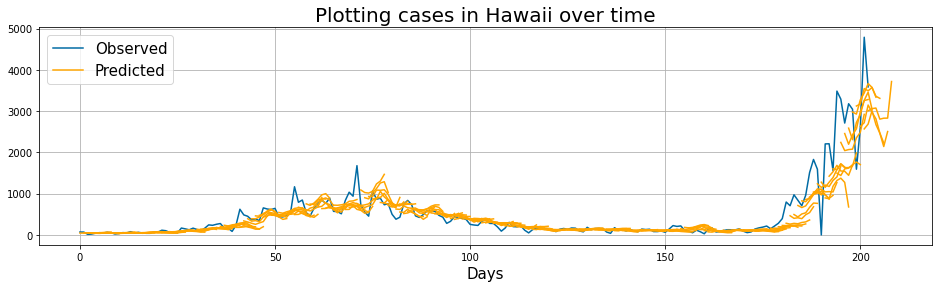

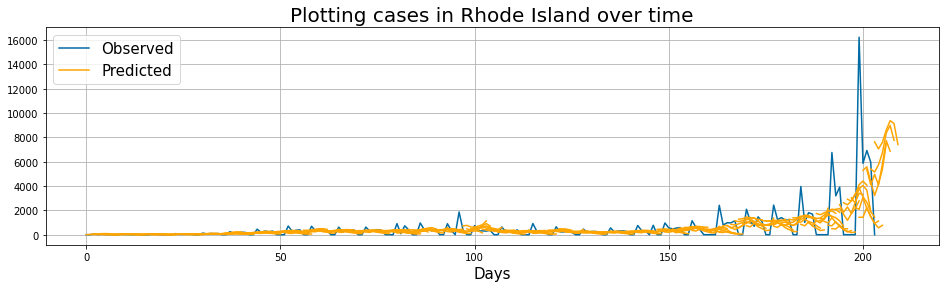

In [112]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=gru_1.predict(X_test[indices])
    y_true=y_test[indices]

    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))
for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=gru_1.predict(X_test[indices])
    y_true=y_test[indices]
    
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

In [113]:
y_pred = gru_1.predict(X_test)
print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

Pearson correlation: 0.6228
Root Mean Square Error (RMSE): 5202.2432
Mean Absolute Error (MAE): 1695.1234
Symmetric Mean Absolute Percentage Error (SMAPE): 83.9089


### Bi-GRU with 2 bidirectional layers

In [114]:
# GRU: 2L
def build_gru_2b(model_name):
        model = Sequential(name=model_name)
        model.add(Input(shape = X_train.shape[1:])) 
        model.add(Bidirectional(GRU(units=200, activation='relu', return_sequences = True)))
        model.add(Bidirectional(GRU(units=200, activation='relu', return_sequences = False)))
        model.add(Dense(days_pred, activation='linear'))
        return model

early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_root_mean_squared_error', min_delta=0, patience=3, verbose=0, mode='auto'
)
callbacks = [early_stopping]

gru_2b = build_gru_2b('gru2b')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
gru_2b.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
gru_2b.summary()


history_gru_2b = gru_2b.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks)


Model: "gru2b"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 14, 400)          255600    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 400)              722400    
 nal)                                                            
                                                                 
 dense_7 (Dense)             (None, 7)                 2807      
                                                                 
Total params: 980,807
Trainable params: 980,807
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
353/353 [==============================] - 91s 240ms/step - loss: 1887277.8750 - root_mean_squared_error: 1373.7819 - val_loss: 357158.4688 - val_root_mean_squared_error: 597.6

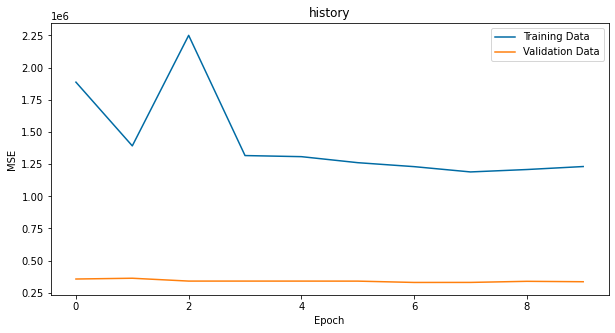

In [115]:
# Plot training history
plot_history(history_gru_2b)

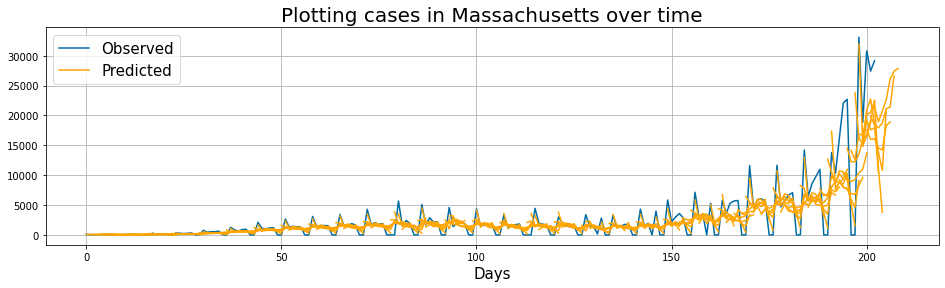

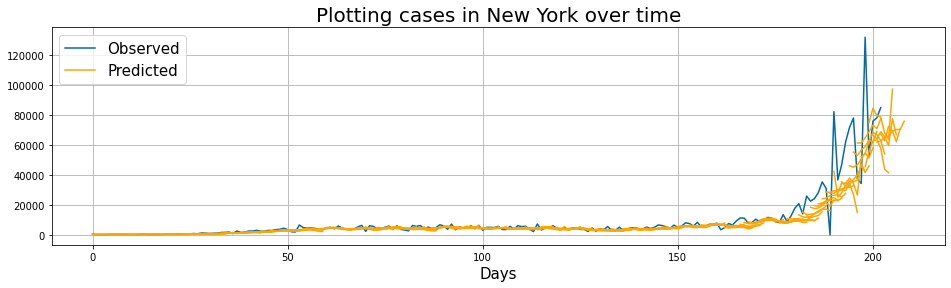

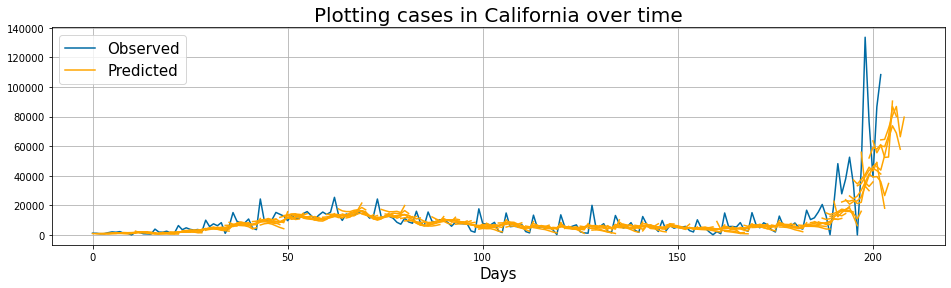

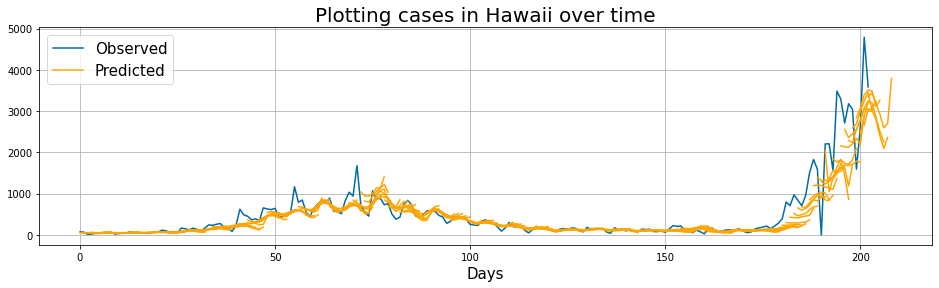

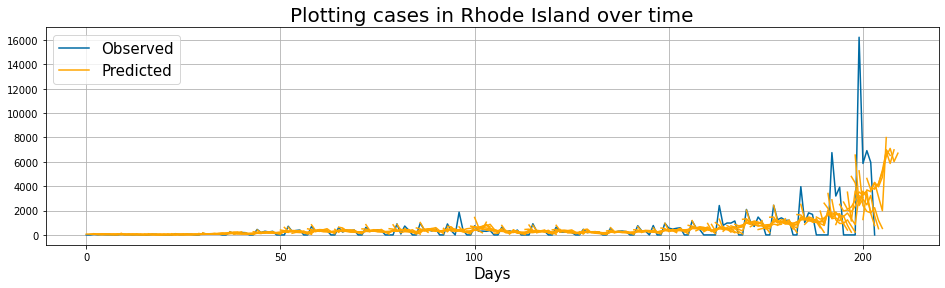

In [116]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=gru_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=gru_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

In [117]:
y_pred = gru_2b.predict(X_test)
print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

Pearson correlation: 0.6603
Root Mean Square Error (RMSE): 5187.0027
Mean Absolute Error (MAE): 1603.7729
Symmetric Mean Absolute Percentage Error (SMAPE): 80.2084


## LSTM
[Return to section index](#3.1.-LSTM)

In this section, we built two long short-term memory (LSTM) for time series predictions. LSTM1 is simple LSTM, followed by a dense layer to transform model output into a sequence of length 7 to match the shape of the outcome. LSTM2B use two bidirectional LSTM layers.



### LSTM with 1 layer

In [118]:
# LSTM: 1L
def build_lstm_baseline(model_name):
        model = Sequential(name=model_name)
        model.add(Input(shape = X_train.shape[1:])) 
        model.add(LSTM(units=200, activation='relu', return_sequences = False))
        model.add(Dense(days_pred, activation='linear'))
        return model

early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', min_delta=0, patience=3, verbose=0, mode='auto'
)
callbacks = [early_stopping]

lstm_baseline = build_lstm_baseline('lstm_baseline')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
lstm_baseline.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
lstm_baseline.summary()

Model: "lstm_baseline"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 200)               169600    
                                                                 
 dense_8 (Dense)             (None, 7)                 1407      
                                                                 
Total params: 171,007
Trainable params: 171,007
Non-trainable params: 0
_________________________________________________________________


In [119]:
history1 = lstm_baseline.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks
        )  

Epoch 1/50
353/353 [==============================] - 19s 49ms/step - loss: 2554092.7500 - root_mean_squared_error: 1598.1530 - val_loss: 414037.8750 - val_root_mean_squared_error: 643.4578
Epoch 2/50
353/353 [==============================] - 18s 52ms/step - loss: 2243908.2500 - root_mean_squared_error: 1497.9680 - val_loss: 373663.0625 - val_root_mean_squared_error: 611.2798
Epoch 3/50
353/353 [==============================] - 18s 52ms/step - loss: 1821328.5000 - root_mean_squared_error: 1349.5656 - val_loss: 379470.8125 - val_root_mean_squared_error: 616.0120
Epoch 4/50
353/353 [==============================] - 18s 52ms/step - loss: 1810795.7500 - root_mean_squared_error: 1345.6578 - val_loss: 388109.9375 - val_root_mean_squared_error: 622.9847
Epoch 5/50
353/353 [==============================] - 18s 50ms/step - loss: 1601275.1250 - root_mean_squared_error: 1265.4154 - val_loss: 382937.9688 - val_root_mean_squared_error: 618.8198


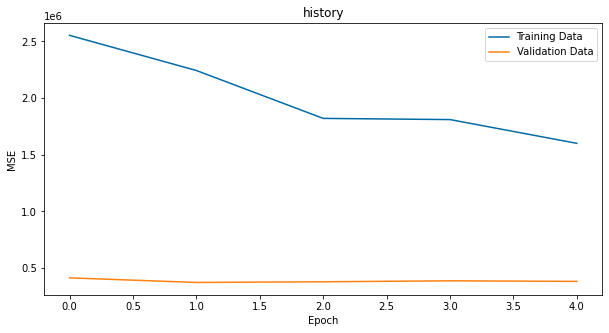

In [120]:
# Plot training history
plot_history(history1)

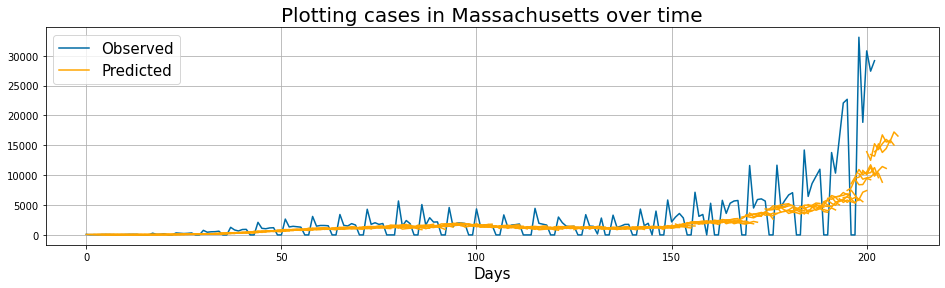

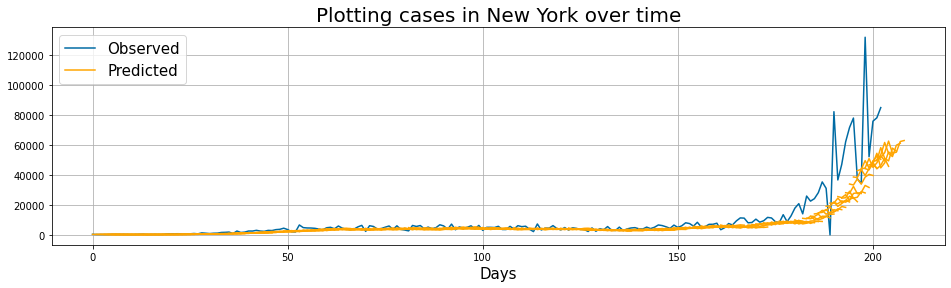

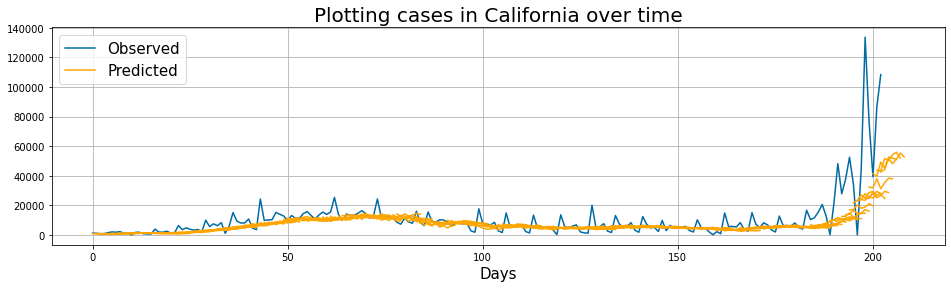

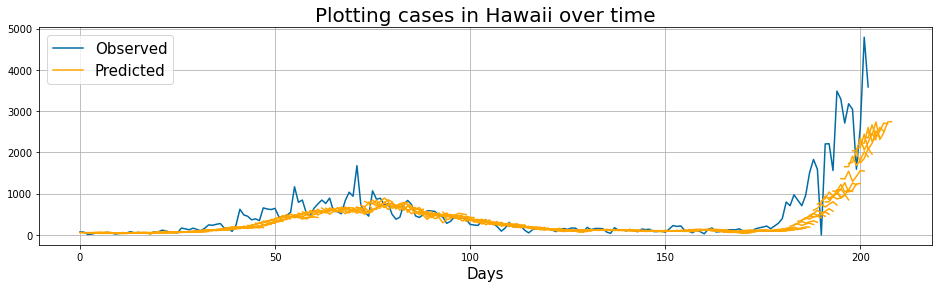

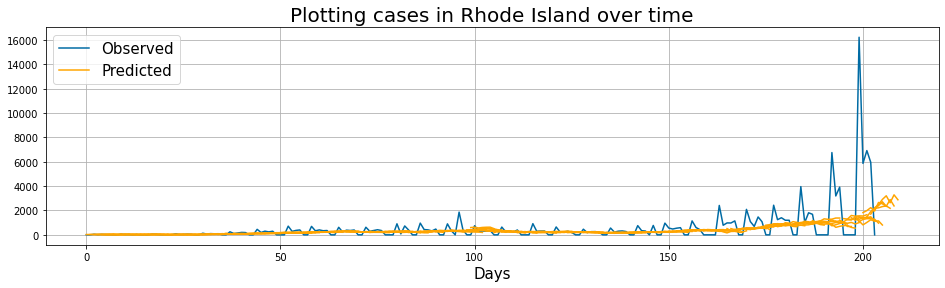

In [121]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=lstm_baseline.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))
for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=lstm_baseline.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

In [122]:
y_pred=lstm_baseline.predict(X_test)
print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

Pearson correlation: 0.5973
Root Mean Square Error (RMSE): 5281.9472
Mean Absolute Error (MAE): 1778.0275
Symmetric Mean Absolute Percentage Error (SMAPE): 92.0510


### Bi-LSTM with 2 bidirectional layers

In [123]:
# LSTM: 2 bidirectional layers
def build_lstm_2l_2b(model_name):
        model = Sequential(name=model_name)
        model.add(Input(shape = X_train.shape[1:])) 
        model.add(Bidirectional(LSTM(units=200, activation='relu',return_sequences=True)))
        model.add(Bidirectional(LSTM(units=200, activation='relu')))
        model.add(Dense(days_pred, activation='linear'))
        return model
        
early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', min_delta=0, patience=3, verbose=0, mode='auto'
)
callbacks = [early_stopping]

lstm_2l_2b = build_lstm_2l_2b('lstm_2l_2b')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
lstm_2l_2b.compile(optimizer=optimizer, loss='mse', metrics = metrics)

lstm_2l_2b.summary()

history4 = lstm_2l_2b.fit(
        x=X_train, 
        y=y_train, 
        validation_split = 0.1, 
        batch_size=64, 
        epochs=50, 
        verbose=1,
        shuffle = True, 
        callbacks=callbacks)  

Model: "lstm_2l_2b"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_4 (Bidirectio  (None, 14, 400)          339200    
 nal)                                                            
                                                                 
 bidirectional_5 (Bidirectio  (None, 400)              961600    
 nal)                                                            
                                                                 
 dense_9 (Dense)             (None, 7)                 2807      
                                                                 
Total params: 1,303,607
Trainable params: 1,303,607
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
353/353 [==============================] - 76s 198ms/step - loss: 3512559.2500 - root_mean_squared_error: 1874.1823 - val_loss: 421945.9062 - val_root_mean_squared_err

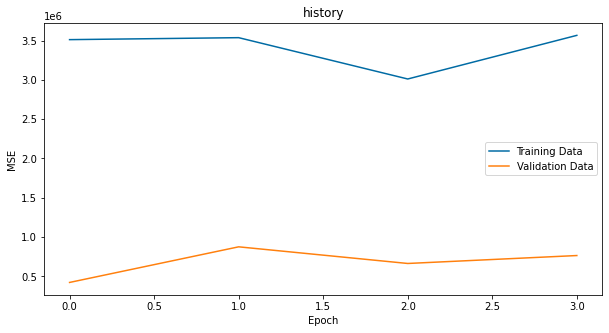

In [124]:
# Plot training history
plot_history(history4)

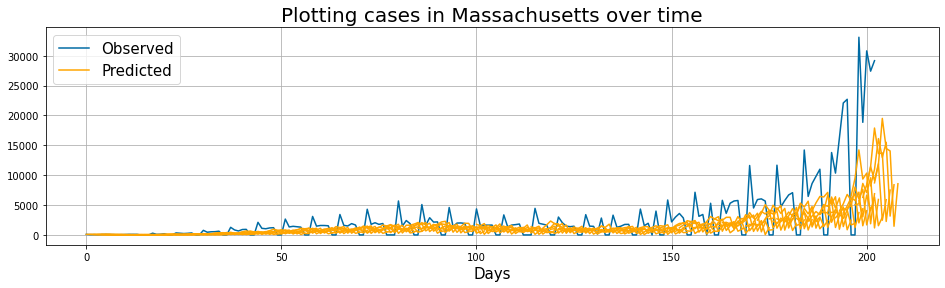

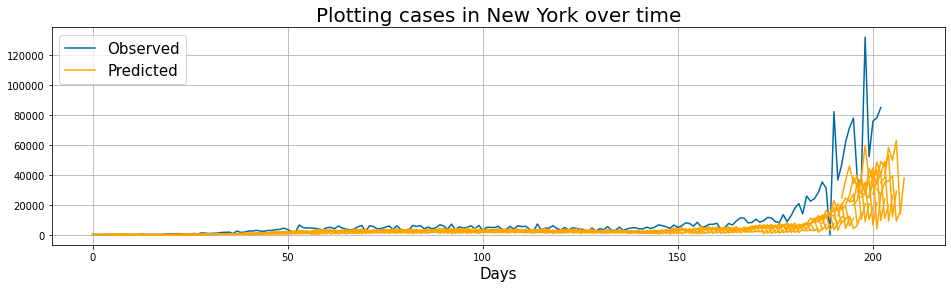

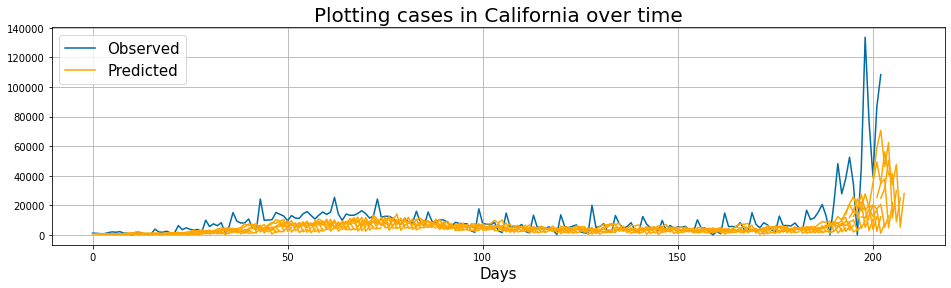

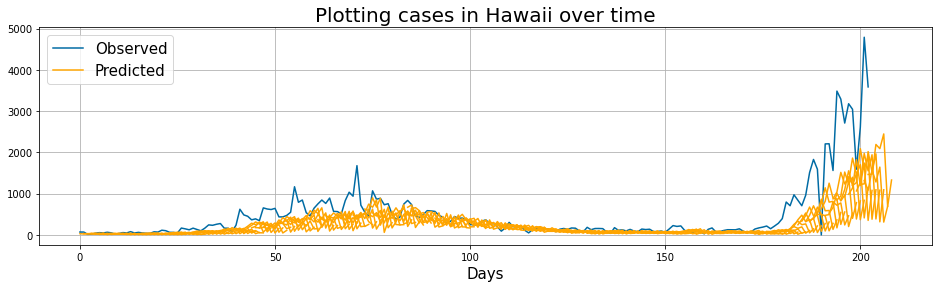

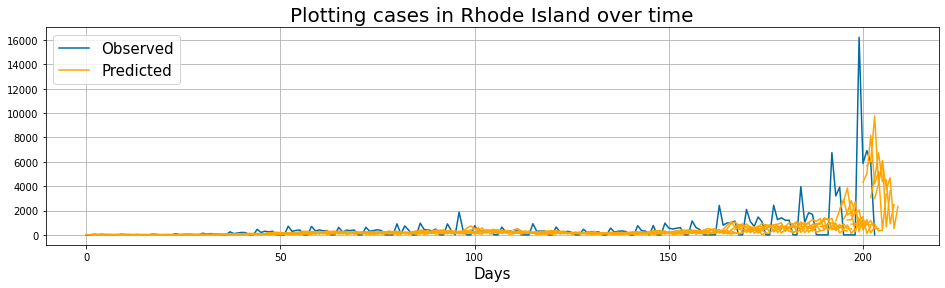

In [125]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=lstm_2l_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=lstm_2l_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

In [126]:
y_pred=lstm_2l_2b.predict(X_test)
print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

Pearson correlation: 0.5179
Root Mean Square Error (RMSE): 5786.8154
Mean Absolute Error (MAE): 2021.1495
Symmetric Mean Absolute Percentage Error (SMAPE): 112.8837


## Model Comparison

Conv-NN: 
Pearson correlation: 0.6641
Root Mean Square Error (RMSE): 4998.9929
Mean Absolute Error (MAE): 1746.8153
Symmetric Mean Absolute Percentage Error (SMAPE): 96.7432


RNN: 
Pearson correlation: 0.6756
Root Mean Square Error (RMSE): 4848.1871
Mean Absolute Error (MAE): 1461.0913
Symmetric Mean Absolute Percentage Error (SMAPE): 80.7814


Bi-RNN: 
Pearson correlation: 0.6883
Root Mean Square Error (RMSE): 5013.6910
Mean Absolute Error (MAE): 1453.8002
Symmetric Mean Absolute Percentage Error (SMAPE): 86.1171


LSTM: 
Pearson correlation: 0.5973
Root Mean Square Error (RMSE): 5281.9472
Mean Absolute Error (MAE): 1778.0275
Symmetric Mean Absolute Percentage Error (SMAPE): 92.0510


Bi-LSTM: 
Pearson correlation: 0.5179
Root Mean Square Error (RMSE): 5786.8154
Mean Absolute Error (MAE): 2021.1495
Symmetric Mean Absolute Percentage Error (SMAPE): 112.8837


GRU: 
Pearson correlation: 0.6228
Root Mean Square Error (RMSE): 5202.2432
Mean Absolute Error (MAE): 1695.1234
Symmetric Mean 

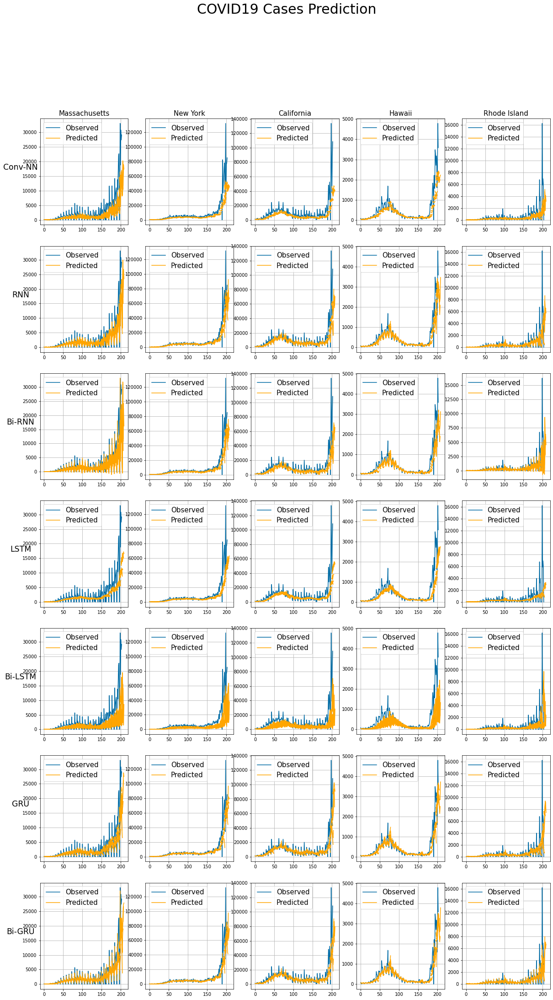

In [127]:
plot_5states(mod = [nn_1, rnn_1,rnn_2b,lstm_baseline, lstm_2l_2b, gru_1,gru_2b], 
             mod_name = ['Conv-NN', 'RNN', 'Bi-RNN', 'LSTM','Bi-LSTM','GRU','Bi-GRU'],
             name="COVID19 Cases")

RNN1 has the best performance overall, with the high correlation score, lowest RMSE, MAE and sMAPE.

All of these neural network models have shown 'lagged' prediction - where the peak of each predictive curve is later than the true observations. Therefore, we switch to using 7 previous days' data to predict the next 2 days' covid cases.

In [128]:
# get training data and testing data for models
days_train=7
days_pred=2
X_train, y_train, _,state_train,date_train = create_dataset(df1_train, days_train, days_pred)
X_test, y_test, _, state_test,date_test= create_dataset(df1_test, days_train, days_pred)

print("X_train and y_train shape:")
print(X_train.shape,y_train.shape)
print("X_test and y_test shape:")
print(X_test.shape,y_test.shape)

X_train and y_train shape:
(25650, 7, 11) (25650, 2)
X_test and y_test shape:
(10751, 7, 11) (10751, 2)


In [129]:
# nn

nn_1 = build_nn('nn1')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
nn_1.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
nn_1.summary()


history_nn_1 = nn_1.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks)

Model: "nn1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 5, 64)             2176      
                                                                 
 conv1d_3 (Conv1D)           (None, 3, 128)            24704     
                                                                 
 flatten_1 (Flatten)         (None, 384)               0         
                                                                 
 dense_10 (Dense)            (None, 256)               98560     
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                                 
 dense_11 (Dense)            (None, 128)               32896     
                                                                 
 dropout_3 (Dropout)         (None, 128)               0       

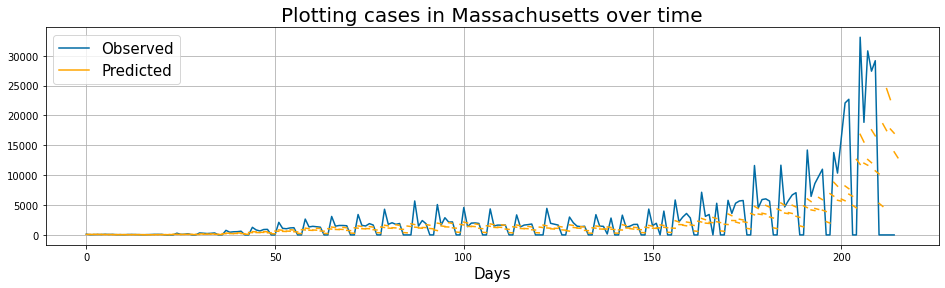

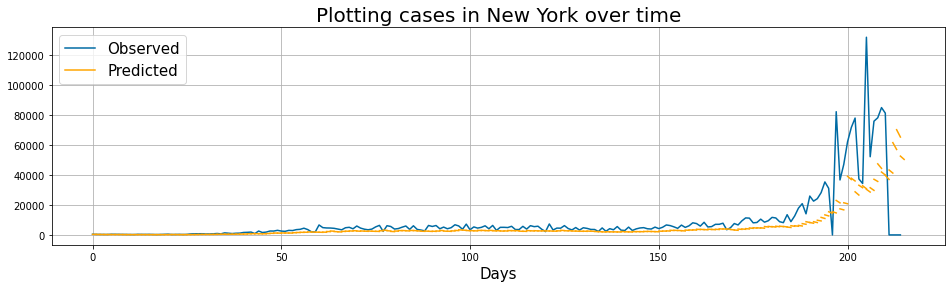

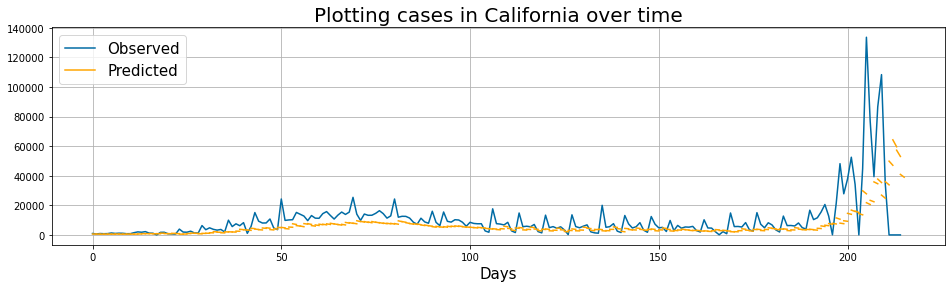

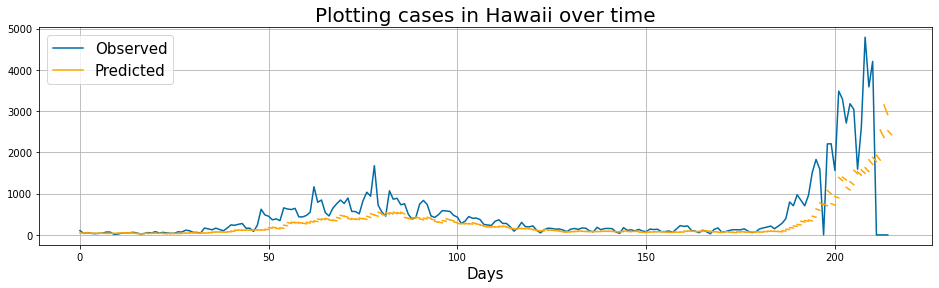

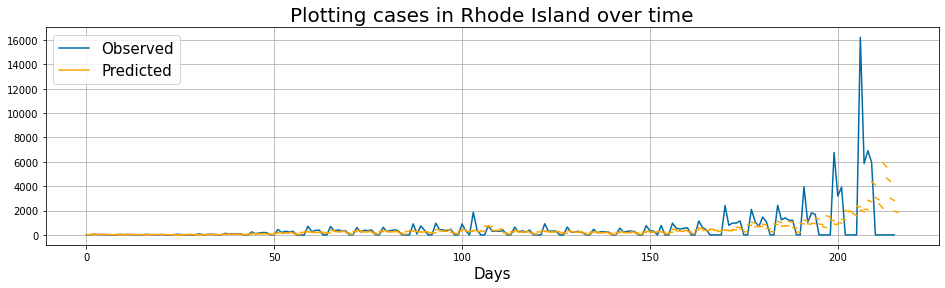

In [130]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=nn_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=nn_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

In [131]:
# RNN: 1 layer

rnn_1 = build_rnn_1('rnn_baseline')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
rnn_1.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
rnn_1.summary()

history = rnn_1.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks
        )

y_pred=rnn_1.predict(X_test)
print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

# viz

Model: "rnn_baseline"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_3 (SimpleRNN)    (None, 200)               42400     
                                                                 
 dense_14 (Dense)            (None, 2)                 402       
                                                                 
Total params: 42,802
Trainable params: 42,802
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
361/361 [==============================] - 6s 14ms/step - loss: 1411136.6250 - root_mean_squared_error: 1187.9127 - val_loss: 329608.7812 - val_root_mean_squared_error: 574.1157
Epoch 2/50
361/361 [==============================] - 5s 13ms/step - loss: 1186597.8750 - root_mean_squared_error: 1089.3108 - val_loss: 352339.0000 - val_root_mean_squared_error: 593.5815
Epoch 3/50
361/361 [==============================] - 5s 13ms/step -

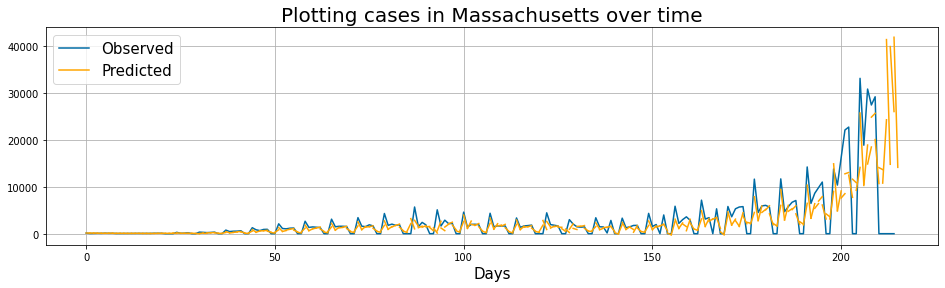

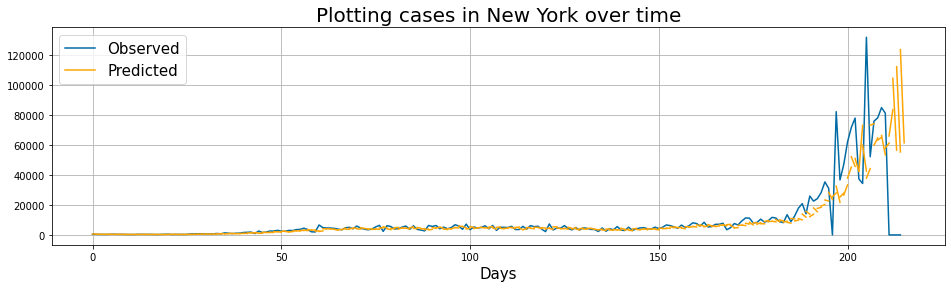

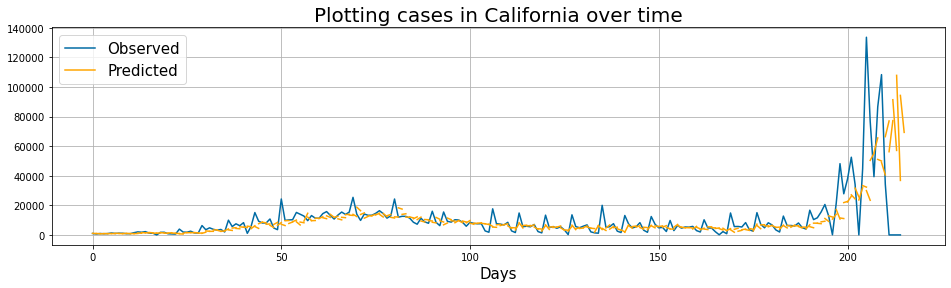

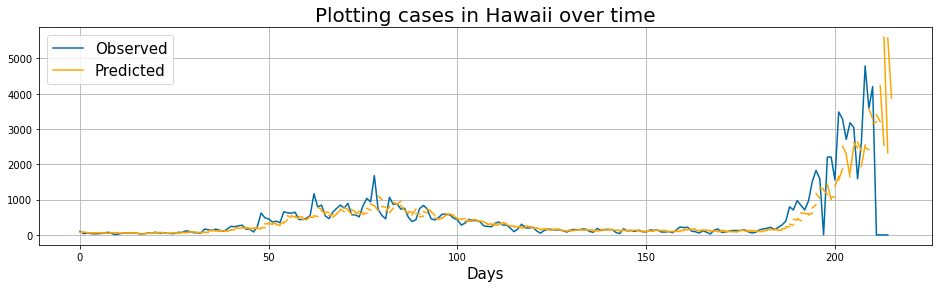

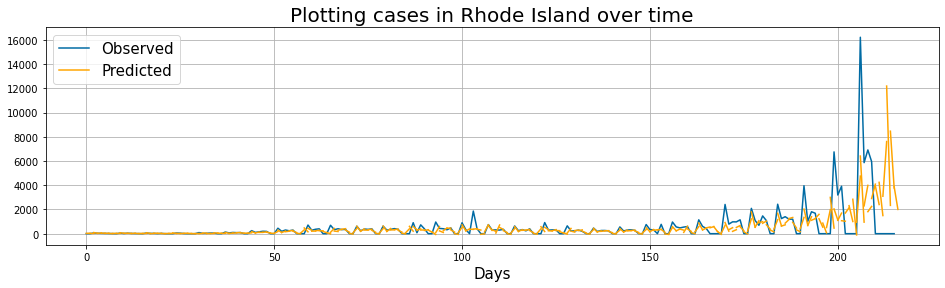

In [132]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=rnn_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))
for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=rnn_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

In [133]:
# RNN: 2 bidirectional layers

rnn_2b = build_rnn_2b('rnn_2b')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
rnn_2b.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
rnn_2b.summary()


history = rnn_2b.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks
        )

y_pred=rnn_2b.predict(X_test)
print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

#viz

Model: "rnn_2b"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_6 (Bidirectio  (None, 7, 400)           84800     
 nal)                                                            
                                                                 
 bidirectional_7 (Bidirectio  (None, 400)              240400    
 nal)                                                            
                                                                 
 dense_15 (Dense)            (None, 2)                 802       
                                                                 
Total params: 326,002
Trainable params: 326,002
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
361/361 [==============================] - 20s 47ms/step - loss: 1304053.3750 - root_mean_squared_error: 1141.9517 - val_loss: 310600.1875 - val_root_mean_squared_error: 557.3

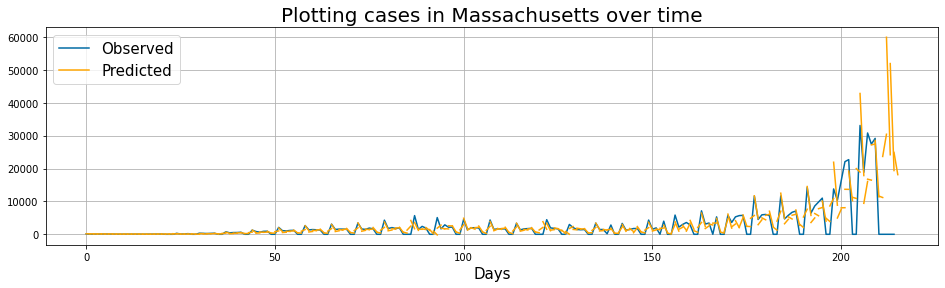

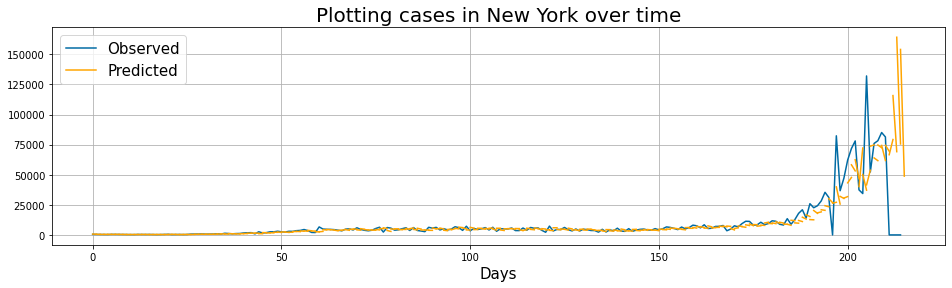

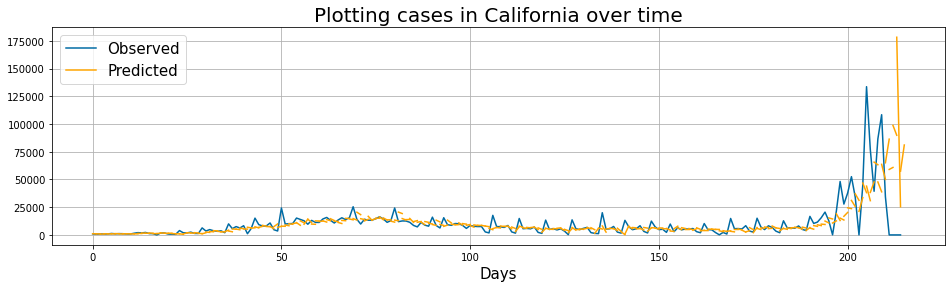

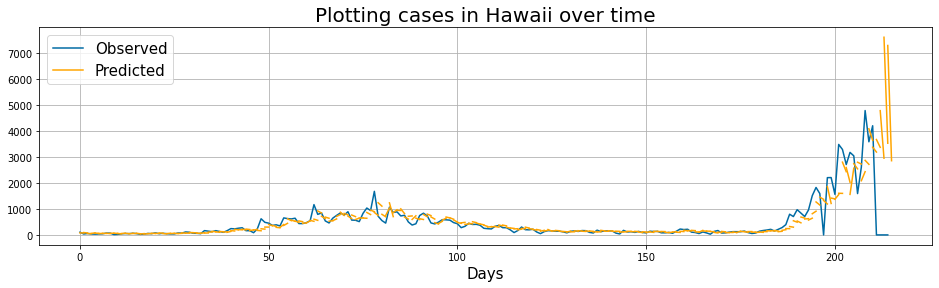

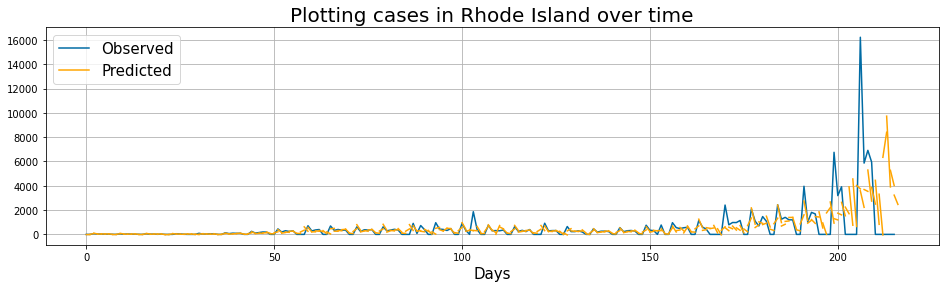

In [134]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=rnn_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=rnn_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))


In [135]:
# LSTM: 1 layer

lstm_baseline = build_lstm_baseline('lstm_baseline')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
lstm_baseline.compile(optimizer=optimizer, loss='mse', metrics = metrics)

lstm_baseline.summary()

history = lstm_baseline.fit(
        x=X_train, 
        y=y_train, 
        validation_split = 0.1, 
        batch_size=64, 
        epochs=50, 
        verbose=1,
        shuffle = True, 
        callbacks=callbacks)  

y_pred=lstm_baseline.predict(X_test)
print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

# viz

Model: "lstm_baseline"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 200)               169600    
                                                                 
 dense_16 (Dense)            (None, 2)                 402       
                                                                 
Total params: 170,002
Trainable params: 170,002
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
361/361 [==============================] - 12s 30ms/step - loss: 1279556.6250 - root_mean_squared_error: 1131.1749 - val_loss: 309660.7812 - val_root_mean_squared_error: 556.4717
Epoch 2/50
361/361 [==============================] - 11s 30ms/step - loss: 1158164.7500 - root_mean_squared_error: 1076.1807 - val_loss: 330291.5625 - val_root_mean_squared_error: 574.7100
Epoch 3/50
361/361 [==============================] - 11s 29ms/

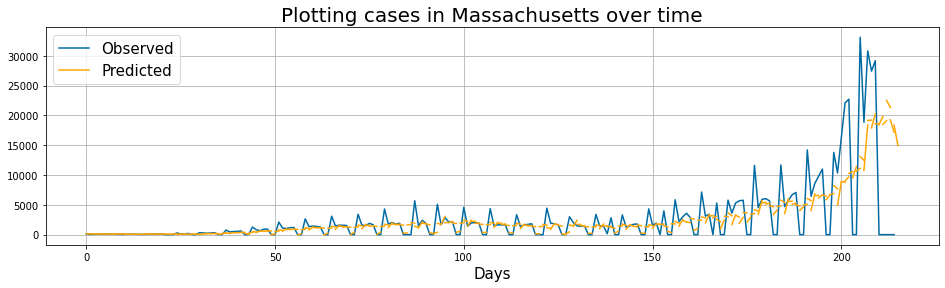

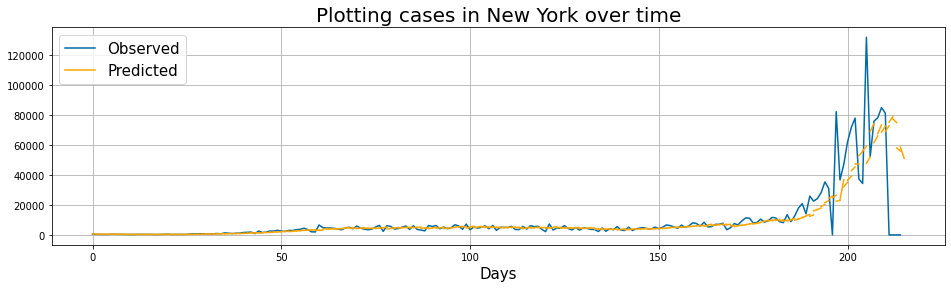

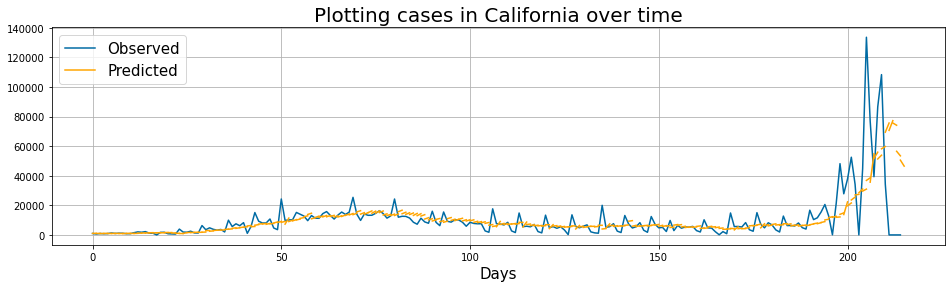

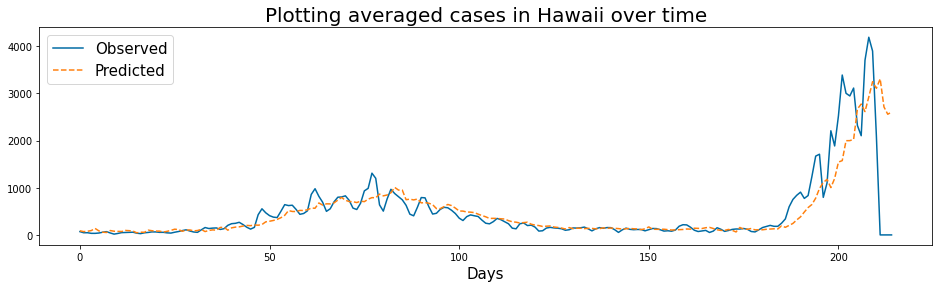

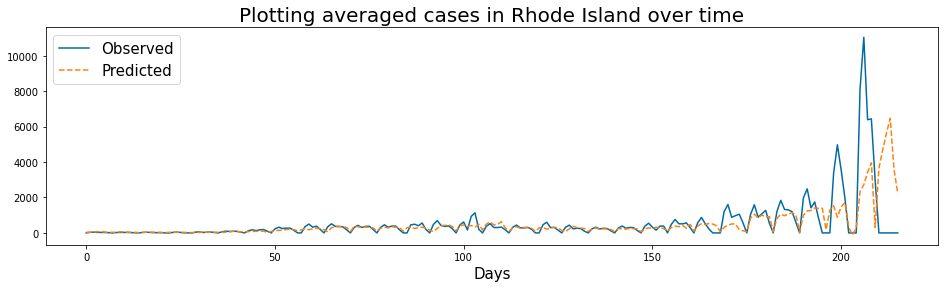

In [136]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=lstm_baseline.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=lstm_baseline.predict(X_test[indices])
    y_true=y_test[indices]

    plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    # plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

In [137]:
# LSTM: 2 bidirectional layers

lstm_2l_2b = build_lstm_2l_2b('lstm_2l_2b')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
lstm_2l_2b.compile(optimizer=optimizer, loss='mse', metrics = metrics)

lstm_2l_2b.summary()

history = lstm_2l_2b.fit(
        x=X_train, 
        y=y_train, 
        validation_split = 0.1, 
        batch_size=64, 
        epochs=50, 
        verbose=1,
        shuffle = True, 
        callbacks=callbacks)  

y_pred=lstm_2l_2b.predict(X_test)

print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

# viz



Model: "lstm_2l_2b"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_8 (Bidirectio  (None, 7, 400)           339200    
 nal)                                                            
                                                                 
 bidirectional_9 (Bidirectio  (None, 400)              961600    
 nal)                                                            
                                                                 
 dense_17 (Dense)            (None, 2)                 802       
                                                                 
Total params: 1,301,602
Trainable params: 1,301,602
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
361/361 [==============================] - 44s 106ms/step - loss: 1397066.5000 - root_mean_squared_error: 1181.9756 - val_loss: 315667.6562 - val_root_mean_squared_err

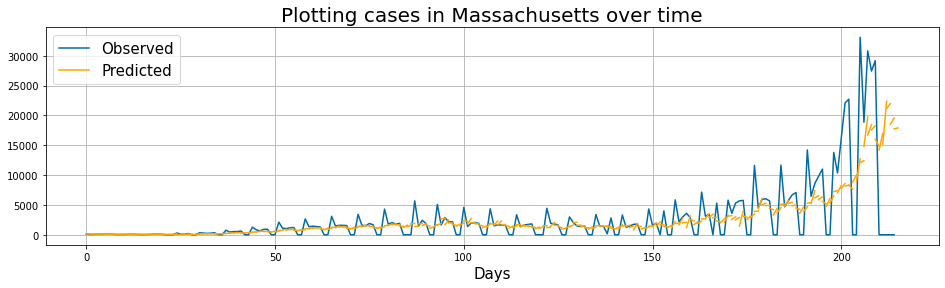

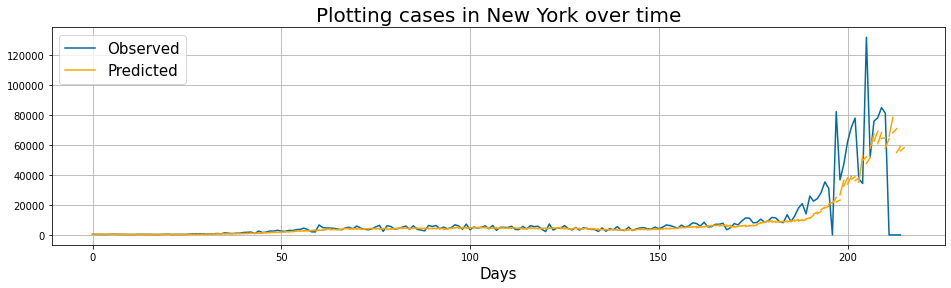

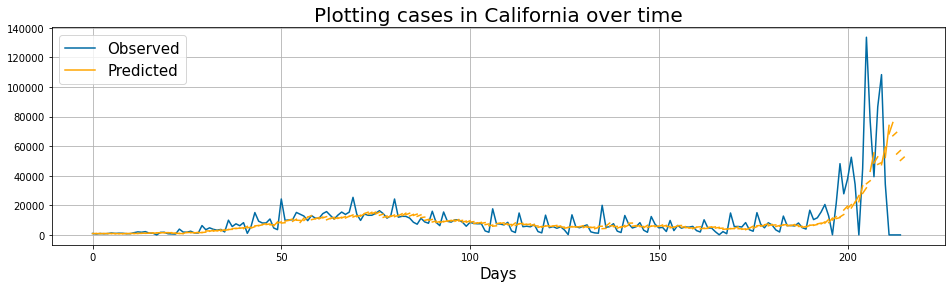

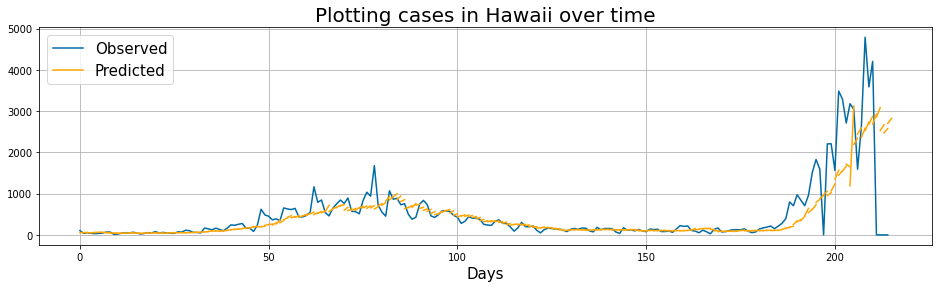

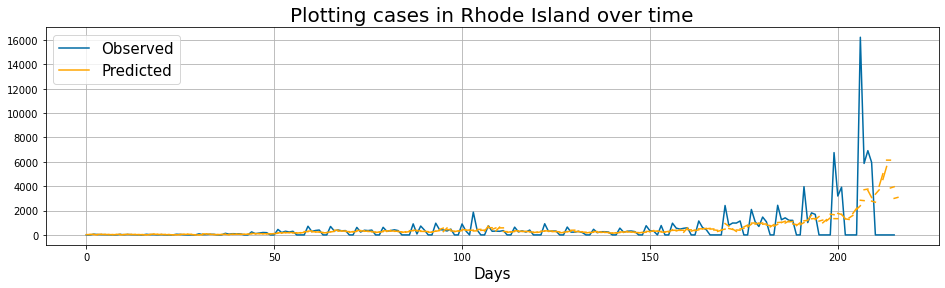

In [138]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=lstm_2l_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=lstm_2l_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

In [139]:
# GRU: 1 layer

gru_1 = build_gru_1('gru1')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
gru_1.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
gru_1.summary()


history = gru_1.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks)

y_pred=gru_1.predict(X_test)

print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

Model: "gru1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_3 (GRU)                 (None, 200)               127800    
                                                                 
 dense_18 (Dense)            (None, 2)                 402       
                                                                 
Total params: 128,202
Trainable params: 128,202
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
361/361 [==============================] - 15s 37ms/step - loss: 1580754.0000 - root_mean_squared_error: 1257.2803 - val_loss: 312179.7812 - val_root_mean_squared_error: 558.7305
Epoch 2/50
361/361 [==============================] - 13s 36ms/step - loss: 1130850.6250 - root_mean_squared_error: 1063.4147 - val_loss: 361621.4688 - val_root_mean_squared_error: 601.3497
Epoch 3/50
361/361 [==============================] - 13s 35ms/step - lo

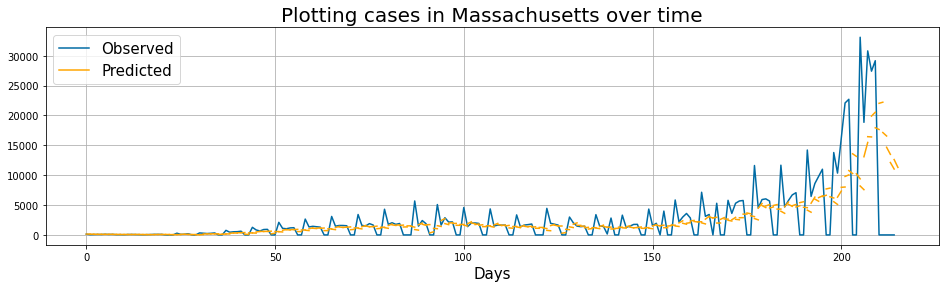

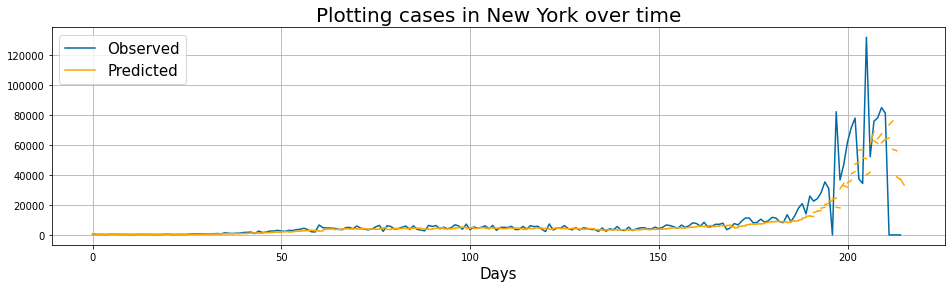

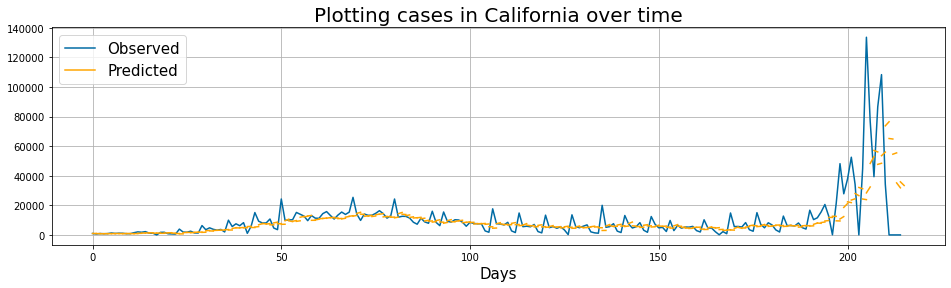

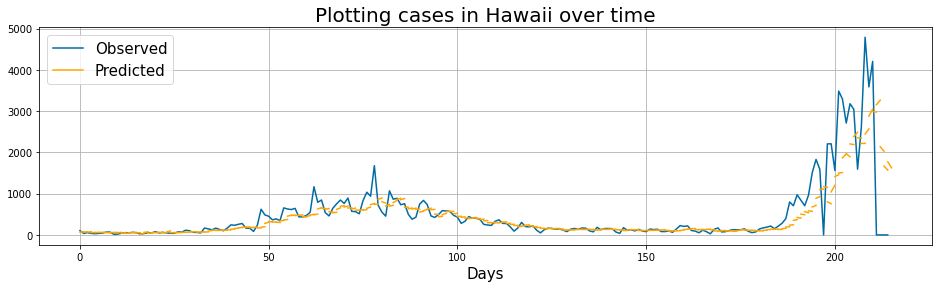

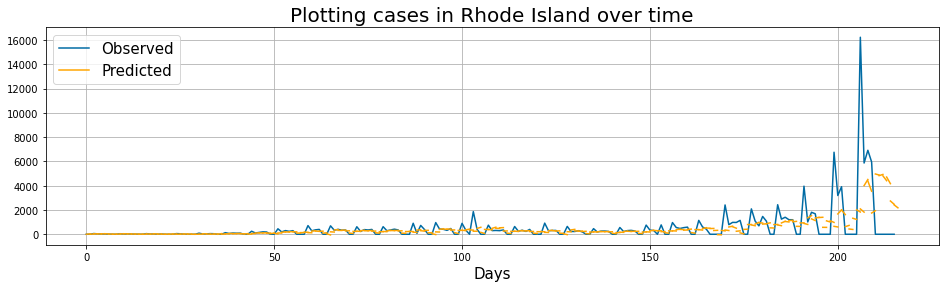

In [140]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=gru_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=gru_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

In [141]:
# GRU: 2 bidirectional layers

gru_2b = build_gru_2b('gru_2b')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
gru_2b.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
gru_2b.summary()


history_gru_2b = gru_2b.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks)

y_pred=gru_2b.predict(X_test)

print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

Model: "gru_2b"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_10 (Bidirecti  (None, 7, 400)           255600    
 onal)                                                           
                                                                 
 bidirectional_11 (Bidirecti  (None, 400)              722400    
 onal)                                                           
                                                                 
 dense_19 (Dense)            (None, 2)                 802       
                                                                 
Total params: 978,802
Trainable params: 978,802
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
361/361 [==============================] - 54s 133ms/step - loss: 1336894.5000 - root_mean_squared_error: 1156.2416 - val_loss: 305075.5000 - val_root_mean_squared_error: 552.

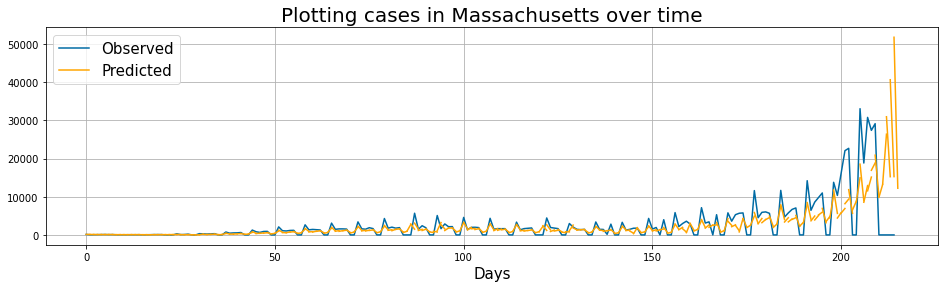

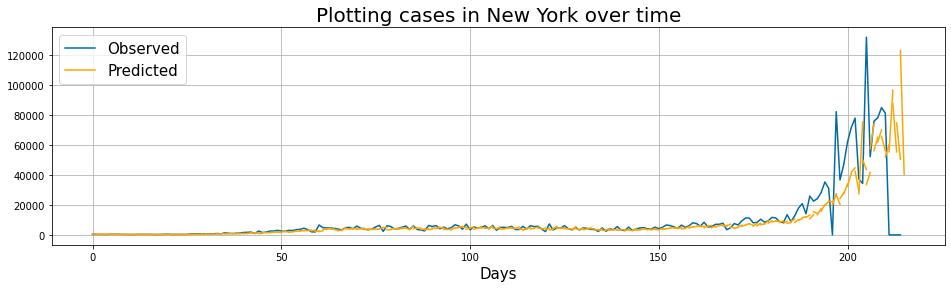

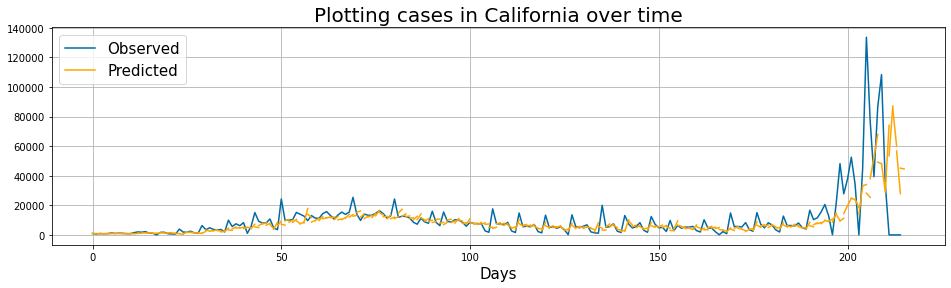

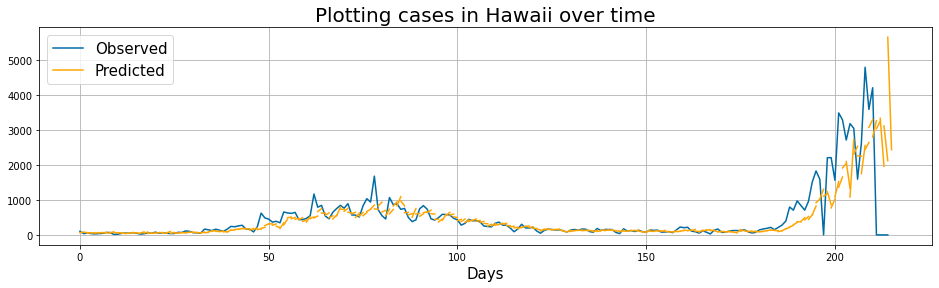

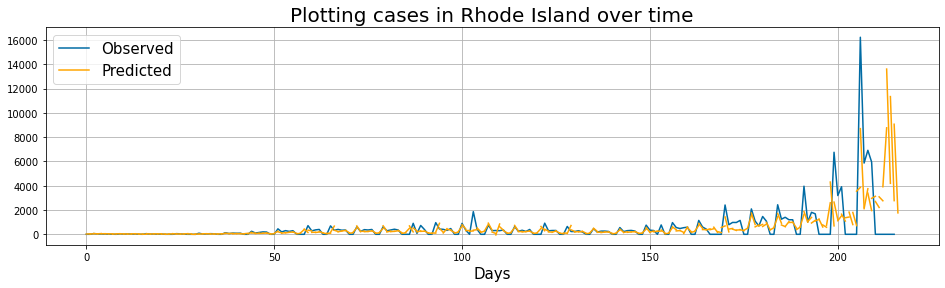

In [142]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=gru_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=gru_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='cases in {}'.format(state))

Conv-NN: 
Pearson correlation: 0.5461
Root Mean Square Error (RMSE): 5765.4813
Mean Absolute Error (MAE): 1831.7308
Symmetric Mean Absolute Percentage Error (SMAPE): 94.5317


RNN: 
Pearson correlation: 0.5580
Root Mean Square Error (RMSE): 6183.2531
Mean Absolute Error (MAE): 1545.3760
Symmetric Mean Absolute Percentage Error (SMAPE): 81.7380


Bi-RNN: 
Pearson correlation: 0.5329
Root Mean Square Error (RMSE): 7048.0411
Mean Absolute Error (MAE): 1591.1460
Symmetric Mean Absolute Percentage Error (SMAPE): 78.8350


LSTM: 
Pearson correlation: 0.5865
Root Mean Square Error (RMSE): 5544.0257
Mean Absolute Error (MAE): 1630.0693
Symmetric Mean Absolute Percentage Error (SMAPE): 83.0640


Bi-LSTM: 
Pearson correlation: 0.5983
Root Mean Square Error (RMSE): 5345.9680
Mean Absolute Error (MAE): 1674.1690
Symmetric Mean Absolute Percentage Error (SMAPE): 82.2925


GRU: 
Pearson correlation: 0.5854
Root Mean Square Error (RMSE): 5496.5033
Mean Absolute Error (MAE): 1699.4486
Symmetric Mean A

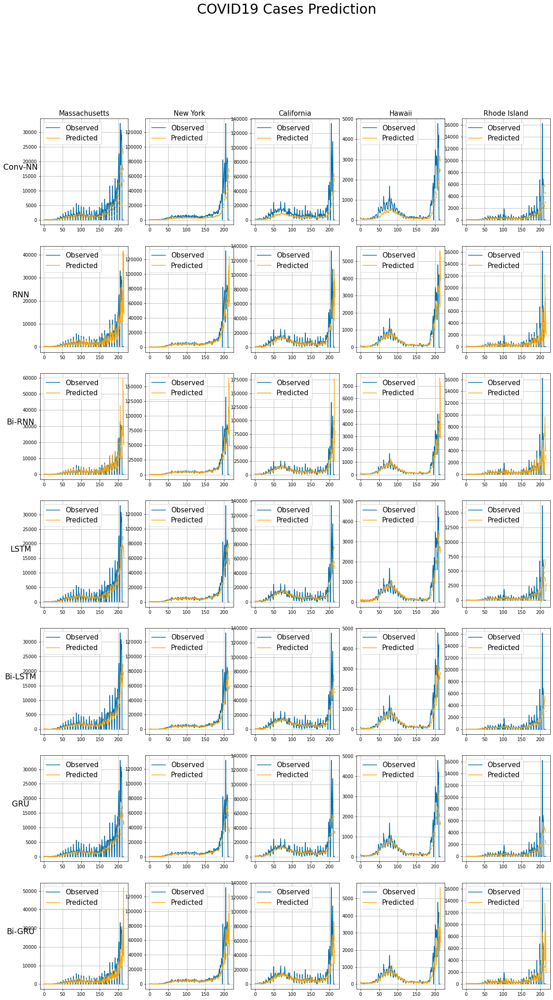

In [143]:
plot_5states(mod = [nn_1, rnn_1,rnn_2b,lstm_baseline, lstm_2l_2b, gru_1,gru_2b], 
             mod_name = ['Conv-NN', 'RNN', 'Bi-RNN', 'LSTM','Bi-LSTM','GRU','Bi-GRU'],
             name="COVID19 Cases")

This time, we have seen that these neural network models learns the curve better, at the expense of smaller length of time prediction. RNN1 remains to be the best model among all. 

## Using JHU_deaths as response variable

In [144]:
def create_dataset(df, days_train, days_pred):
        X = np.array([])
        y = np.array([])
        yp = np.array([])
        state=[]
        date=[]
        gp = df.groupby('state')
        for ind in gp.groups.keys():
                df_new = gp.get_group(ind).sort_index()
        
                days_range = len(df_new)
                for i in range(days_range - (days_train + days_pred) + 1):
                        y_window = df_new['JHU_deaths'].iloc[i + days_train: i + (days_train + days_pred)].to_numpy().reshape(1, days_pred)
                        yp_window = df_new['JHU_deaths'].iloc[i: i + days_train].to_numpy().reshape(1, days_train)
                        # 
                        state_ind=df_new['state'][i: i + days_train]
                        date_ind=df_new.index[i: i + days_train]
                        
                        X_window = df_new.drop(columns=['state']).iloc[i: i + days_train, : ].to_numpy().reshape(1, days_train, -1)
                        
                
                        if X.shape[0] != 0:
                                X = np.append(X, X_window, axis = 0)
                                y = np.append(y, y_window, axis = 0)
                                yp = np.append(yp, yp_window, axis = 0)
                                state.append(state_ind[0])
                                date.append(date_ind)
                                
                        else:
                                X = X_window
                                y = y_window
                                yp = yp_window
                                state.append(state_ind[0])
                                date.append(date_ind)
                                
        
        return X, y, yp, state, date

In [145]:
df_full_std['JHU_deaths'] = df_full.JHU_deaths.values
columns=['state', 'JHU_deaths','gt_covid','gt_quarantine','gt_covid symptoms',
                    'gt2_Cough','gt2_Fever', 'gt2_Headache', 
                    'gt2_Fatigue','gt2_Chills','gt2_Shortness of breath',
                    'gt2_Sore throat']

df1=df_full_std[columns]
df1=df1.sort_index()

df1_train, df1_test, df1_cutoff = split_tr_te(df1)
print(df1_train.shape,df1_test.shape)


(26050, 12) (11151, 12)


In [146]:
# get training data and testing data for models
days_train=14
days_pred=7
X_train, y_train, _,state_train,date_train = create_dataset(df1_train, days_train, days_pred)
X_test, y_test, _, state_test,date_test= create_dataset(df1_test, days_train, days_pred)

print("X_train and y_train shape:")
print(X_train.shape,y_train.shape)
print("X_test and y_test shape:")
print(X_test.shape,y_test.shape)

X_train and y_train shape:
(25050, 14, 11) (25050, 7)
X_test and y_test shape:
(10151, 14, 11) (10151, 7)


In [147]:
#nn

nn_1 = build_nn('nn1')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
nn_1.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
nn_1.summary()


history_nn_1 = nn_1.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks)

Model: "nn1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 12, 64)            2176      
                                                                 
 conv1d_5 (Conv1D)           (None, 10, 128)           24704     
                                                                 
 flatten_2 (Flatten)         (None, 1280)              0         
                                                                 
 dense_20 (Dense)            (None, 256)               327936    
                                                                 
 dropout_4 (Dropout)         (None, 256)               0         
                                                                 
 dense_21 (Dense)            (None, 128)               32896     
                                                                 
 dropout_5 (Dropout)         (None, 128)               0       

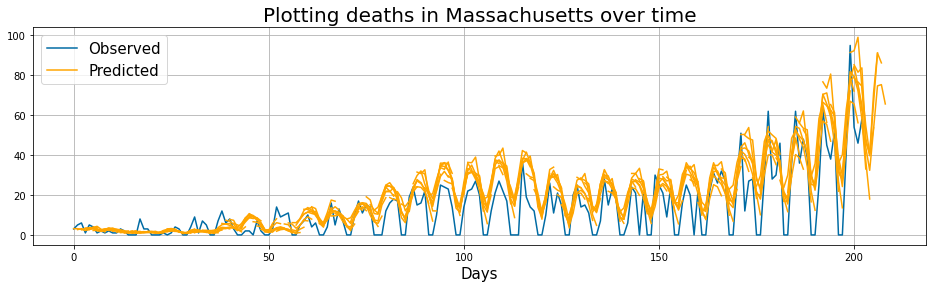

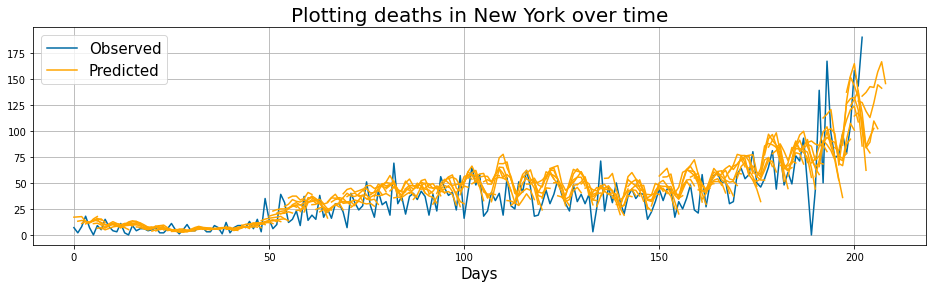

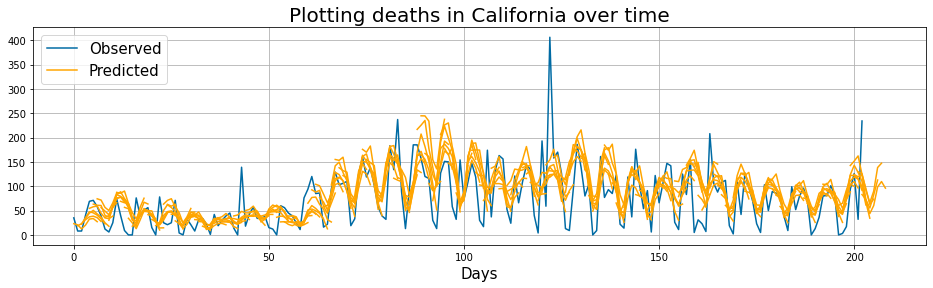

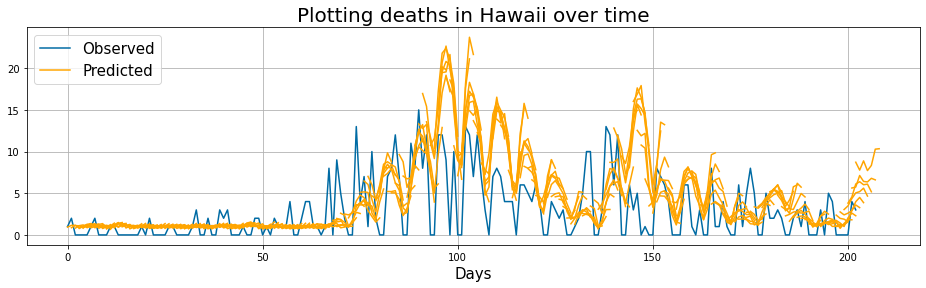

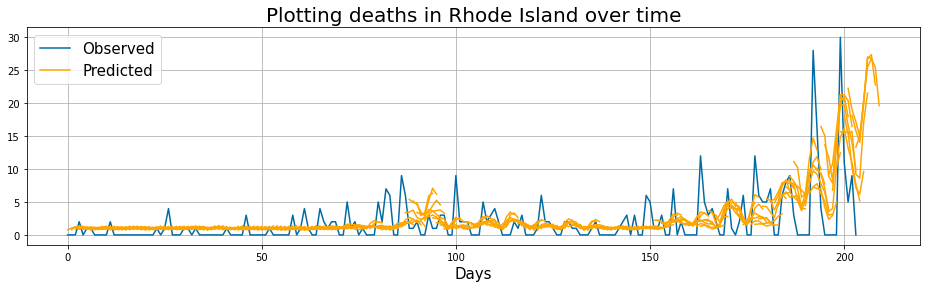

In [148]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=nn_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=nn_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

In [149]:
# RNN: 1 layer

rnn_1 = build_rnn_1('rnn_baseline')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
rnn_1.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
rnn_1.summary()

history = rnn_1.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks
        )

y_pred=rnn_1.predict(X_test)
print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

# viz

Model: "rnn_baseline"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_6 (SimpleRNN)    (None, 200)               42400     
                                                                 
 dense_24 (Dense)            (None, 7)                 1407      
                                                                 
Total params: 43,807
Trainable params: 43,807
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
353/353 [==============================] - 9s 22ms/step - loss: 1142.5173 - root_mean_squared_error: 33.8011 - val_loss: 223.4780 - val_root_mean_squared_error: 14.9492
Epoch 2/50
353/353 [==============================] - 7s 21ms/step - loss: 879.4033 - root_mean_squared_error: 29.6547 - val_loss: 246.7697 - val_root_mean_squared_error: 15.7089
Epoch 3/50
353/353 [==============================] - 8s 22ms/step - loss: 841.4638 - r

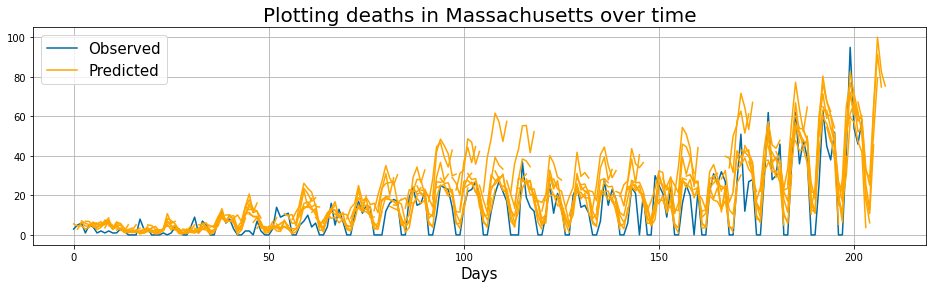

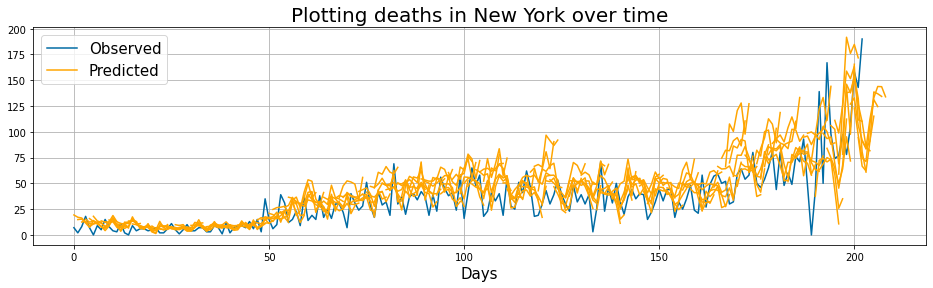

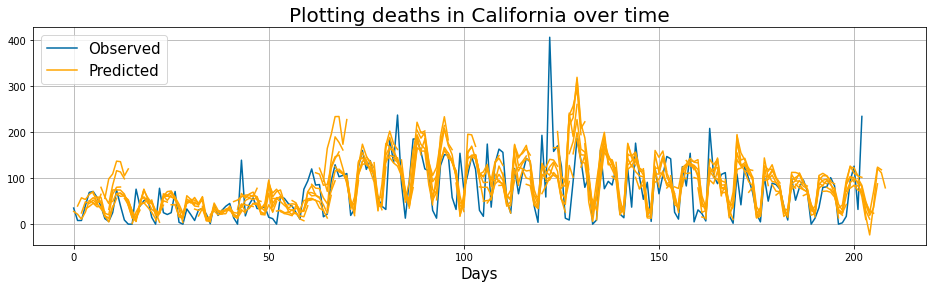

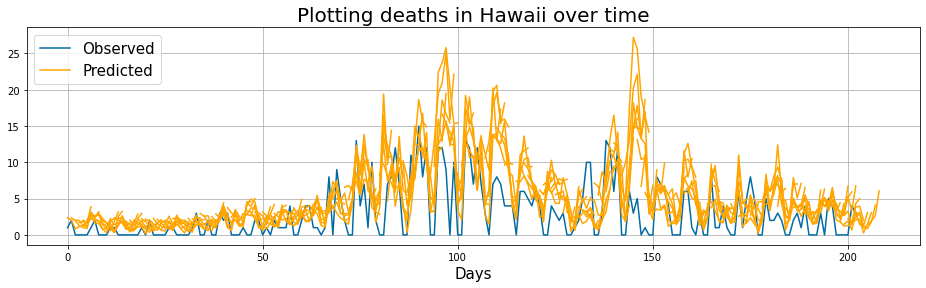

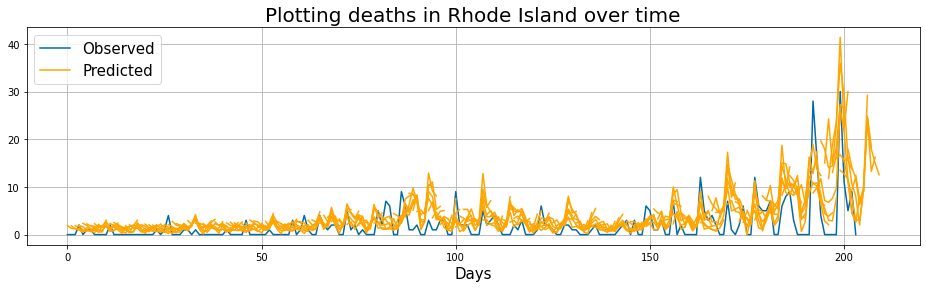

In [150]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=rnn_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=rnn_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

In [151]:
# RNN: 2 bidirectional layers

rnn_2b = build_rnn_2b('rnn_2b')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
rnn_2b.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
rnn_2b.summary()


history = rnn_2b.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks
        )

y_pred=rnn_2b.predict(X_test)
print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

#viz

Model: "rnn_2b"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_12 (Bidirecti  (None, 14, 400)          84800     
 onal)                                                           
                                                                 
 bidirectional_13 (Bidirecti  (None, 400)              240400    
 onal)                                                           
                                                                 
 dense_25 (Dense)            (None, 7)                 2807      
                                                                 
Total params: 328,007
Trainable params: 328,007
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
353/353 [==============================] - 34s 86ms/step - loss: 1074.3696 - root_mean_squared_error: 32.7776 - val_loss: 217.5480 - val_root_mean_squared_error: 14.7495
Epoch

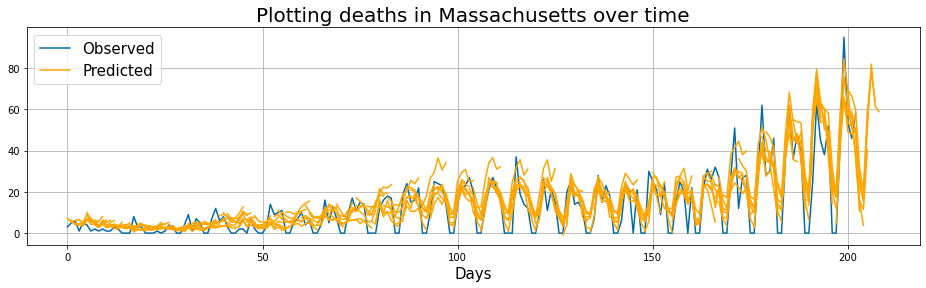

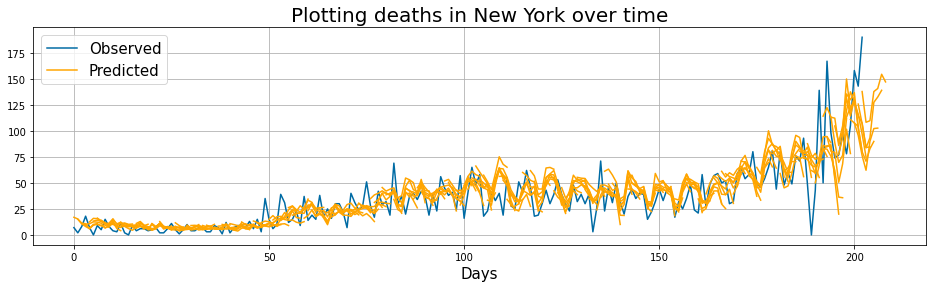

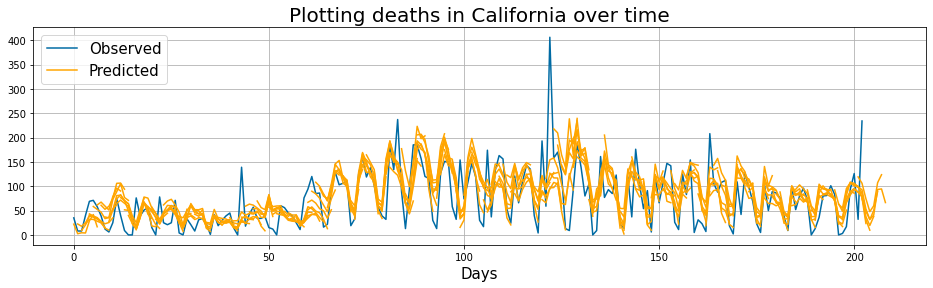

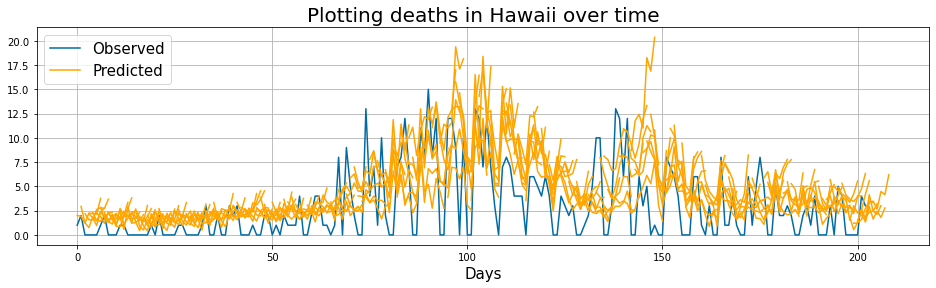

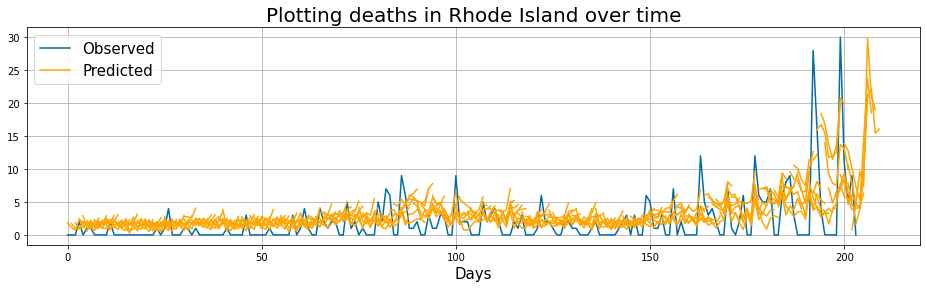

In [152]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=rnn_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=rnn_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

In [153]:
# LSTM: 1 layer

lstm_baseline = build_lstm_baseline('lstm_baseline')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
lstm_baseline.compile(optimizer=optimizer, loss='mse', metrics = metrics)

lstm_baseline.summary()

history = lstm_baseline.fit(
        x=X_train, 
        y=y_train, 
        validation_split = 0.1, 
        batch_size=64, 
        epochs=50, 
        verbose=1,
        shuffle = True, 
        callbacks=callbacks)  

y_pred=lstm_baseline.predict(X_test)
print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

# viz

Model: "lstm_baseline"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 200)               169600    
                                                                 
 dense_26 (Dense)            (None, 7)                 1407      
                                                                 
Total params: 171,007
Trainable params: 171,007
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
353/353 [==============================] - 19s 50ms/step - loss: 1397.3185 - root_mean_squared_error: 37.3807 - val_loss: 297.6397 - val_root_mean_squared_error: 17.2522
Epoch 2/50
353/353 [==============================] - 18s 50ms/step - loss: 1588.0321 - root_mean_squared_error: 39.8501 - val_loss: 387.8280 - val_root_mean_squared_error: 19.6933
Epoch 3/50
353/353 [==============================] - 18s 50ms/step - loss: 1153.

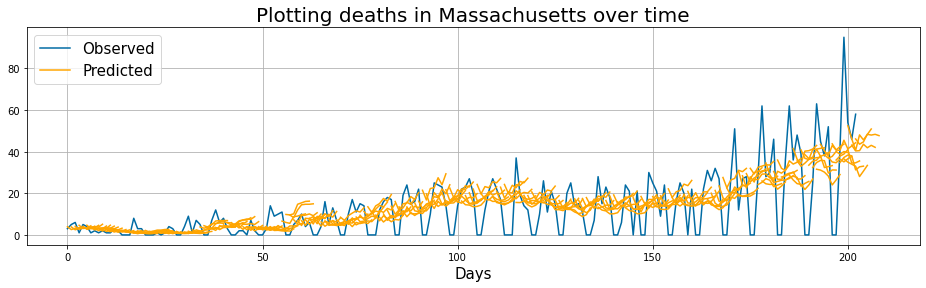

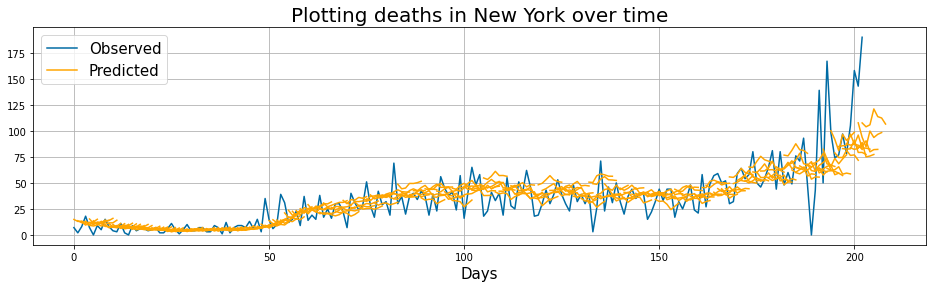

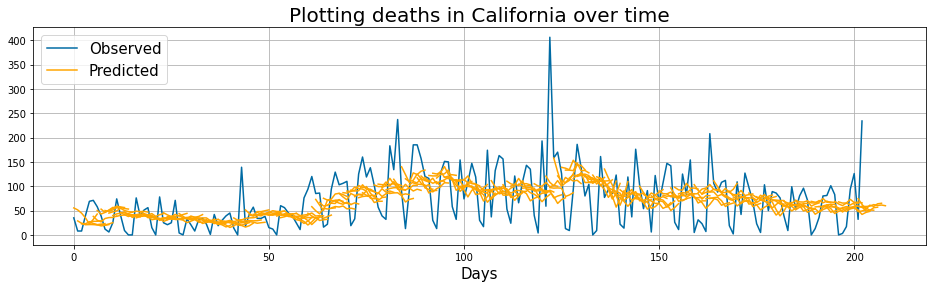

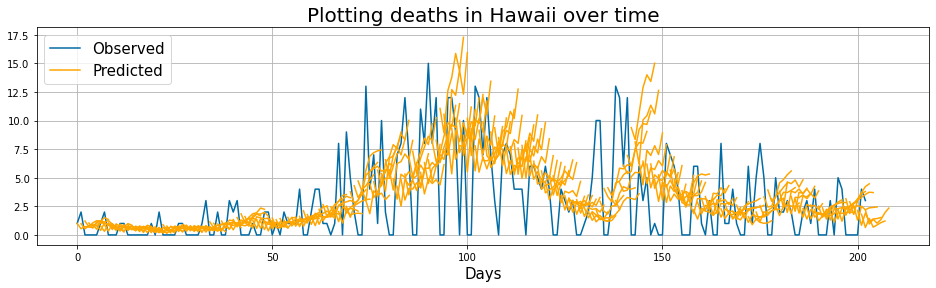

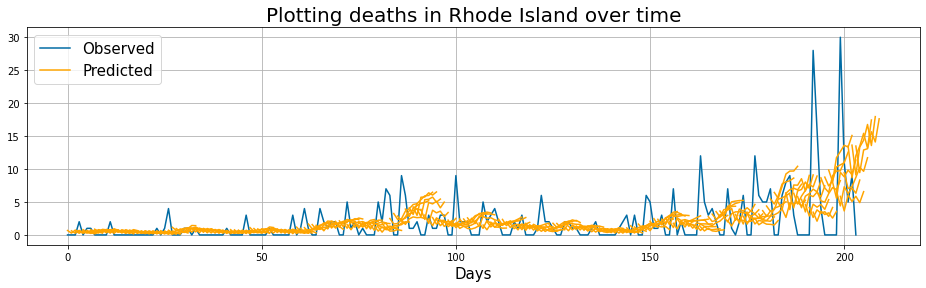

In [154]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=lstm_baseline.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=lstm_baseline.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

In [155]:
# LSTM: 2 bidirectional layers

lstm_2l_2b = build_lstm_2l_2b('lstm_2l_2b')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
lstm_2l_2b.compile(optimizer=optimizer, loss='mse', metrics = metrics)

lstm_2l_2b.summary()

history = lstm_2l_2b.fit(
        x=X_train, 
        y=y_train, 
        validation_split = 0.1, 
        batch_size=64, 
        epochs=50, 
        verbose=1,
        shuffle = True, 
        callbacks=callbacks)  

y_pred=lstm_2l_2b.predict(X_test)

print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

# viz

Model: "lstm_2l_2b"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_14 (Bidirecti  (None, 14, 400)          339200    
 onal)                                                           
                                                                 
 bidirectional_15 (Bidirecti  (None, 400)              961600    
 onal)                                                           
                                                                 
 dense_27 (Dense)            (None, 7)                 2807      
                                                                 
Total params: 1,303,607
Trainable params: 1,303,607
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
353/353 [==============================] - 78s 198ms/step - loss: 1915.2249 - root_mean_squared_error: 43.7633 - val_loss: 423.7619 - val_root_mean_squared_error: 20.5

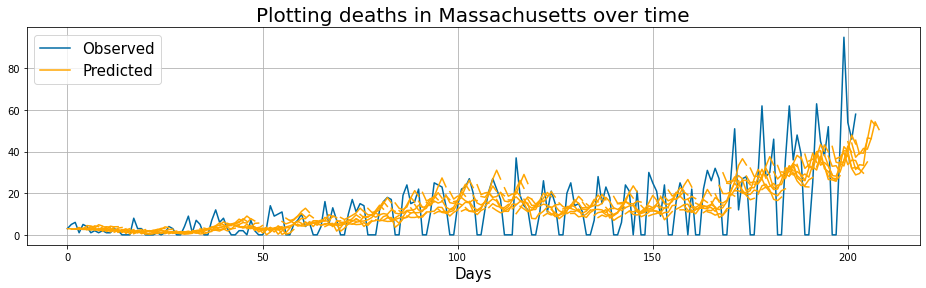

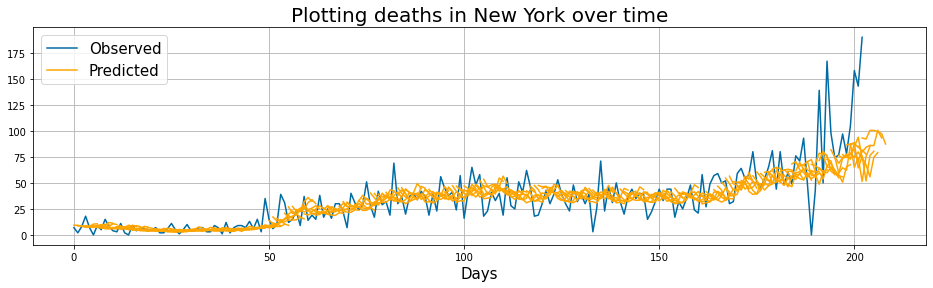

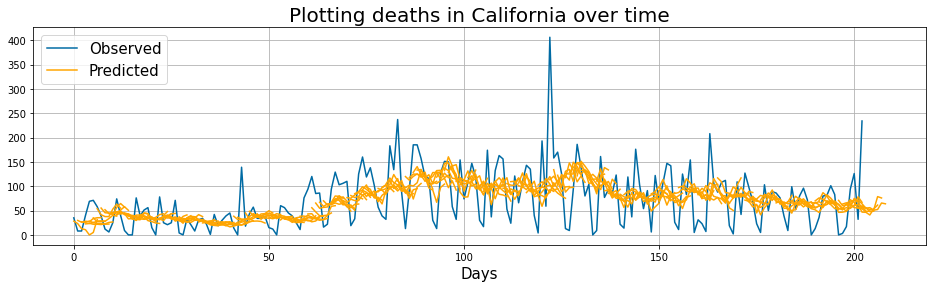

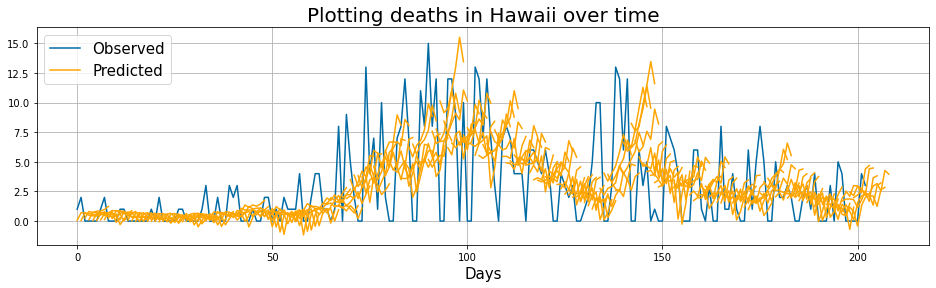

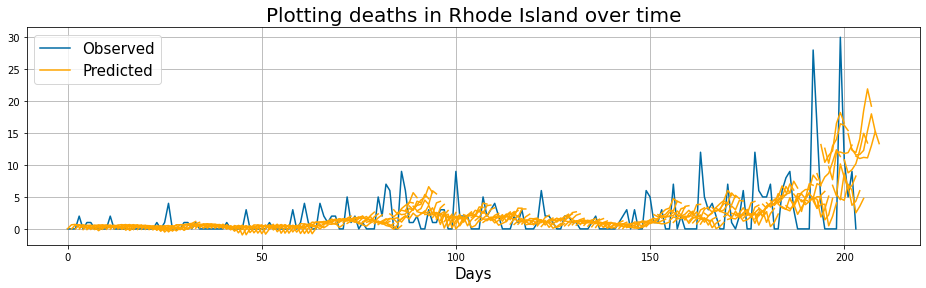

In [156]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=lstm_2l_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=lstm_2l_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

In [157]:
# GRU: 1 layer

gru_1 = build_gru_1('gru1')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
gru_1.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
gru_1.summary()


history = gru_1.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks)

y_pred=gru_1.predict(X_test)

print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

Model: "gru1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_6 (GRU)                 (None, 200)               127800    
                                                                 
 dense_28 (Dense)            (None, 7)                 1407      
                                                                 
Total params: 129,207
Trainable params: 129,207
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
353/353 [==============================] - 26s 68ms/step - loss: 1243.4192 - root_mean_squared_error: 35.2622 - val_loss: 249.7367 - val_root_mean_squared_error: 15.8031
Epoch 2/50
353/353 [==============================] - 24s 67ms/step - loss: 956.8980 - root_mean_squared_error: 30.9338 - val_loss: 238.6664 - val_root_mean_squared_error: 15.4488
Epoch 3/50
353/353 [==============================] - 24s 67ms/step - loss: 889.9595 - root

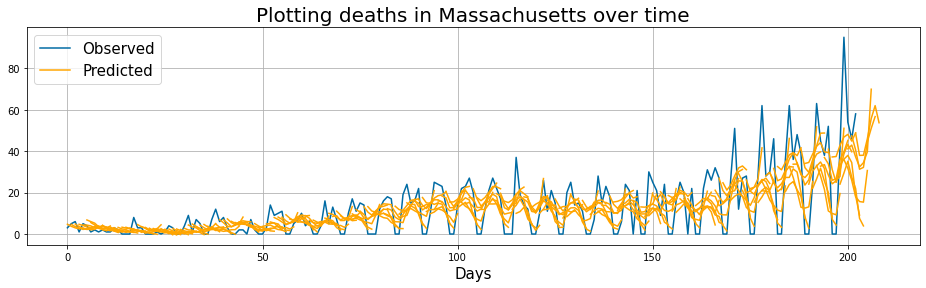

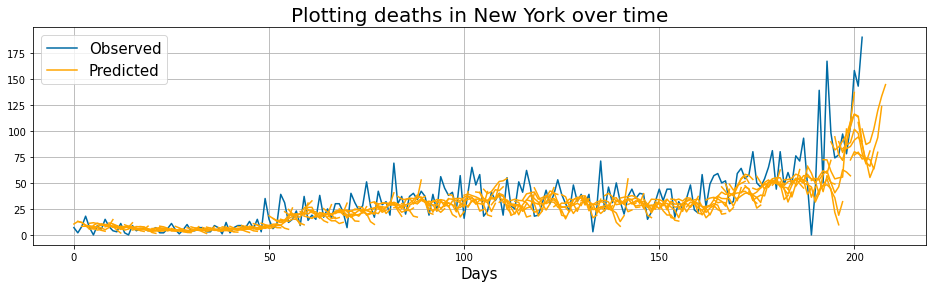

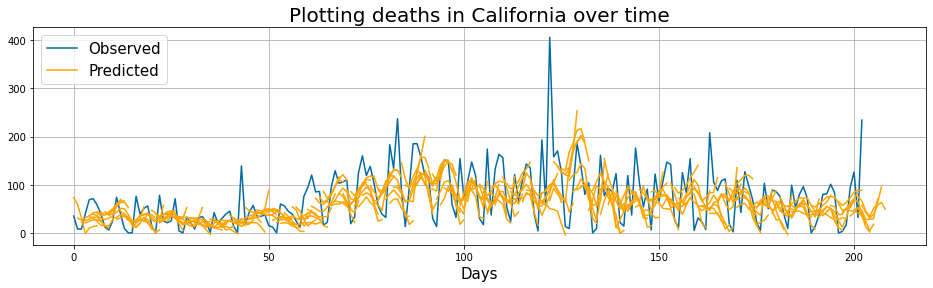

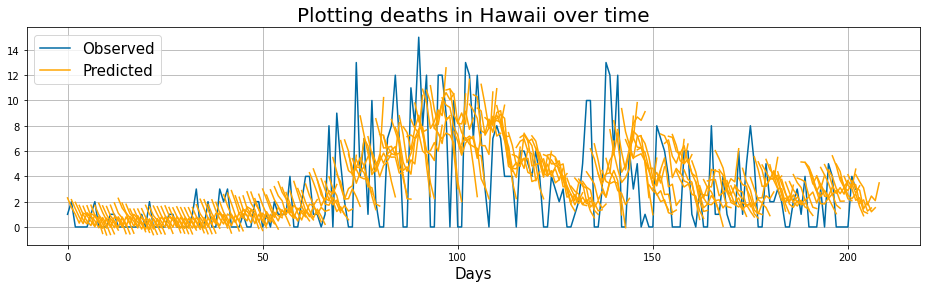

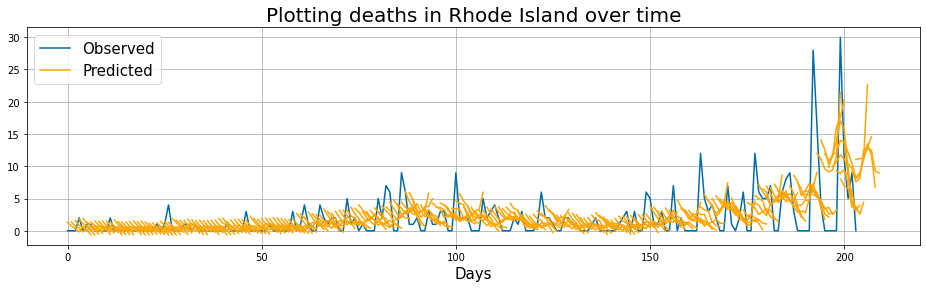

In [158]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=gru_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=gru_1.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

In [159]:
# GRU: 2 bidirectional layers

gru_2b = build_gru_2b('gru_2b')

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
metrics=[tf.keras.metrics.RootMeanSquaredError()]
gru_2b.compile(optimizer=optimizer, loss='mse',metrics=metrics)#, metrics = metrics
gru_2b.summary()


history_gru_2b = gru_2b.fit(
        x=X_train, 
        y=y_train, 
        epochs=50, 
        validation_split = 0.1,
        verbose=1,
        shuffle = True, 
        batch_size=64,
        callbacks=callbacks)

y_pred=gru_2b.predict(X_test)

print_corr(y_test,y_pred)
print_rmse(y_test,y_pred)
print_mae(y_test,y_pred)
print_smape(y_test,y_pred)

Model: "gru_2b"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_16 (Bidirecti  (None, 14, 400)          255600    
 onal)                                                           
                                                                 
 bidirectional_17 (Bidirecti  (None, 400)              722400    
 onal)                                                           
                                                                 
 dense_29 (Dense)            (None, 7)                 2807      
                                                                 
Total params: 980,807
Trainable params: 980,807
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
353/353 [==============================] - 90s 238ms/step - loss: 1174.9136 - root_mean_squared_error: 34.2770 - val_loss: 240.7353 - val_root_mean_squared_error: 15.5156
Epoc

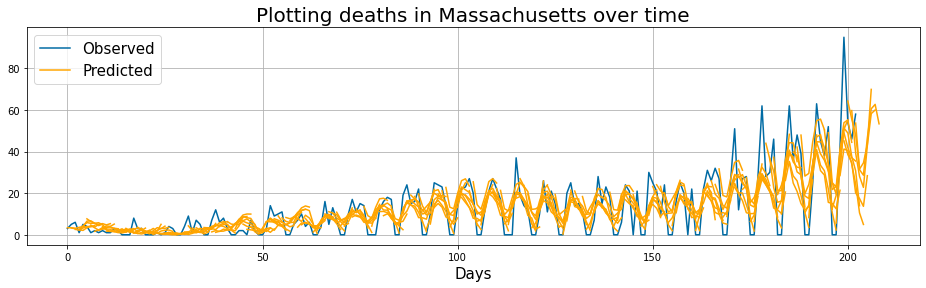

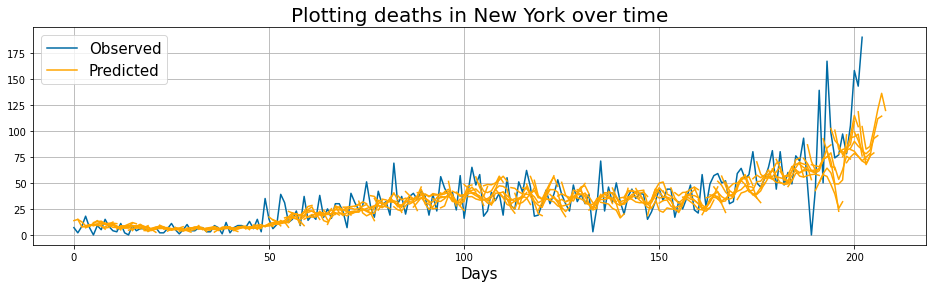

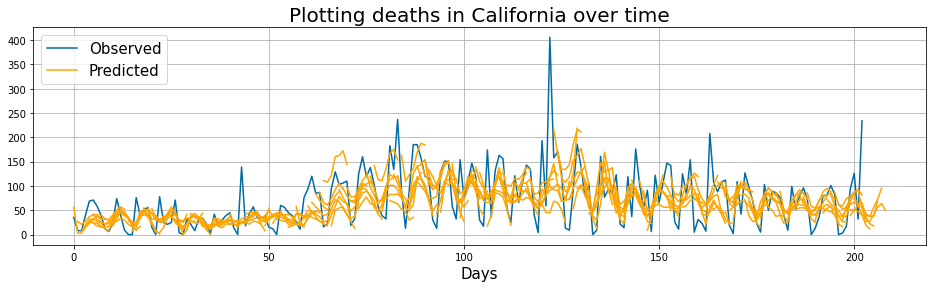

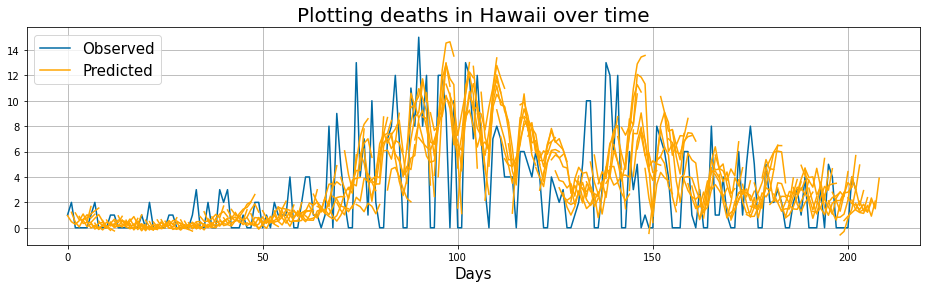

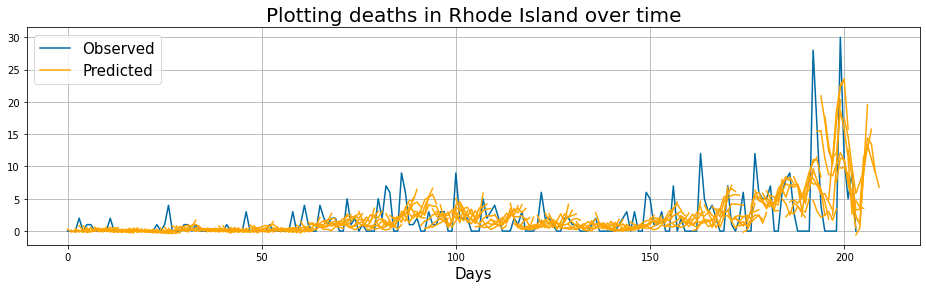

In [160]:
sample_states = ["Massachusetts", "New York", "California"]
sample_states2 = ["Hawaii", "Rhode Island"]

for state in sample_states:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=gru_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

for state in sample_states2:
    indices = [index for index, element in enumerate(state_test) if element == state]

    y_pred=gru_2b.predict(X_test[indices])
    y_true=y_test[indices]

    # plot_avg(y_true,y_pred,name='cases in {}'.format(state))
    plot_ndays(y_true,y_pred,name='deaths in {}'.format(state))

Conv-NN: 
Pearson correlation: 0.5396
Root Mean Square Error (RMSE): 57.6371
Mean Absolute Error (MAE): 18.1589
Symmetric Mean Absolute Percentage Error (SMAPE): 109.5814


RNN: 
Pearson correlation: 0.6451
Root Mean Square Error (RMSE): 54.3280
Mean Absolute Error (MAE): 17.2955
Symmetric Mean Absolute Percentage Error (SMAPE): 108.5664


Bi-RNN: 
Pearson correlation: 0.6179
Root Mean Square Error (RMSE): 55.7150
Mean Absolute Error (MAE): 17.2653
Symmetric Mean Absolute Percentage Error (SMAPE): 106.8637


LSTM: 
Pearson correlation: 0.4817
Root Mean Square Error (RMSE): 60.2393
Mean Absolute Error (MAE): 19.4538
Symmetric Mean Absolute Percentage Error (SMAPE): 110.7156


Bi-LSTM: 
Pearson correlation: 0.5021
Root Mean Square Error (RMSE): 58.7485
Mean Absolute Error (MAE): 18.3747
Symmetric Mean Absolute Percentage Error (SMAPE): 112.2448


GRU: 
Pearson correlation: 0.4894
Root Mean Square Error (RMSE): 64.3193
Mean Absolute Error (MAE): 18.0363
Symmetric Mean Absolute Percentage 

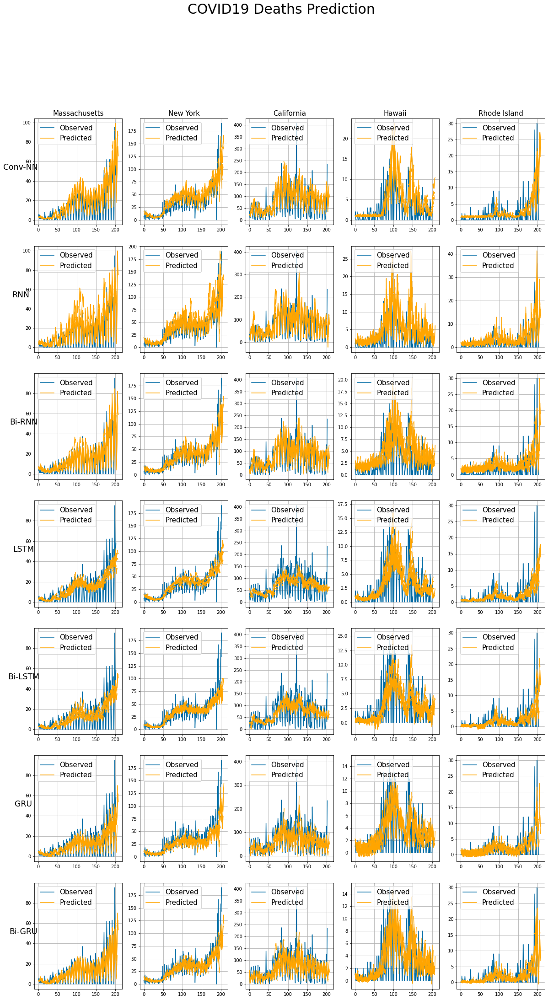

In [161]:
plot_5states(mod = [nn_1, rnn_1,rnn_2b,lstm_baseline, lstm_2l_2b, gru_1,gru_2b], 
             mod_name = ['Conv-NN', 'RNN', 'Bi-RNN', 'LSTM','Bi-LSTM','GRU','Bi-GRU'],
             name="COVID19 Deaths")

Using JHU_deaths as our response variable seems more promising than JHU_cases with much smaller RMSE and MAE. RNN1 remains to be the best model.

# 5. Conclusion

[Return to top](#Notebook-contents)

In the above analysis, we have shown that incorporating Google Search Trend Data is helpful in forecasting the future number of Covid-19 cases and deaths. Among all the models, RNN with 1 layer is simple yet powerful in forecasting the pandemic growth. 

There are some limitations of our project. (1) Relevant google search terms may change as the pandemic progresses.(2) These models are unable to capture sudden increase/decrease of response variable, and the predictions rely heavily on the accessibility of data.(3) There is a trade-off between model accuracy and length of predictions. A model with short predictive window (for example, 1 day) is more accuracy than a long predictive window (for example, 7 day), but such model may not be instructive in real life.

# 6. Next steps & future work

[Return to top](#Notebook-contents)

1. From a spatial analysis point of view, we will consider the evolution of COVID-19 at the areal level in a specified time domain. We will also consider the spatio-temporal correlation in the COVID-19 spread, and incorporate external factors such as sewer water for prediction.

2. We can consider Bayesian modelling in the NN structure, for example, Bayesian Neural Network(BNN) or Bayesian-LSTM-NN, since thay account for the uncertainty of data, especially noisy data, bears on statement regarding COVID-19 evolution. 

3. We can consider GAN, whose generative property will help increase the interpretability of model predictors.

[1] Cabras, S. A Bayesian-Deep Learning Model for Estimating COVID-19 Evolution in Spain. Mathematics 2021, 9, 2921. https://doi.org/10.3390/math9222921

[2] Jianmin Chen and Panpan Zhang. “Clustering US States by Time Series of COVID-19 New Case Counts in the Early Months with Non-Negative Matrix Factorization”. In: Journal of Data Science 20.1 (2022), pp. 79–94.

[3] Ensheng Dong, Hongru Du, and Lauren Gardner. “An interactive web-based dashboard to track COVID-19 in real time”. In: The Lancet infectious diseases 20.5 (2020), pp. 533–534.

[4] Mauricio Santillana et al. “Using clinicians’ search query data to monitor influenza epidemics”. In: Clinical Infectious Diseases 59.10 (2014), pp. 1446–1450.

[5] Artur Strzelecki. “The second worldwide wave of interest in coronavirus since the COVID-19 outbreaks in South Korea, Italy and Iran: A Google Trends study”. In: Brain, behavior, and immunity 88 (2020), p. 950.